# UMAPs Neurips samples, NK cells

In this notebook different markers to identify NK cell subpopulations are tested. Markers are collected from Melsen et al., paper from 2022. RNA and corresponding surface markers are shown when available. Protein expression levels within a cell are normalized using the centered-log ratio (CLR) transformation. UMAPs are generated using latent space representation of measured RNA and surface protein data.  

Reference: 
Melsen, J. E., van Ostaijen-Ten Dam, M. M., Schoorl, D. J. A., Schol, P. J., van den Homberg, D. A. L., Lankester, A. C., Lugthart, G., & Schilham, M. W. (2022). Single-cell transcriptomics in bone marrow delineates CD56dimGranzymeK+ subset as intermediate stage in NK cell differentiation. Frontiers in immunology, 13, 1044398. https://doi.org/10.3389/fimmu.2022.1044398

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import anndata as ad
import scvi
import scanpy as sc
import umap

from ridgeplot import ridgeplot

import warnings

warnings.filterwarnings('ignore')



In [16]:
#Neurips
adata_neurips = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/adata_neurips_norm_outer.h5ad')

In [17]:
#To find gene names

result = [i for i in adata_neurips.var_names if i.startswith('TC')]
print(result)

['TC2N', 'TCAF1', 'TCAF2', 'TCAIM', 'TCAP', 'TCEA1', 'TCEA2', 'TCEA3', 'TCEAL1', 'TCEAL2', 'TCEAL3', 'TCEAL4', 'TCEAL5', 'TCEAL7', 'TCEAL8', 'TCEAL9', 'TCEANC', 'TCEANC2', 'TCEB1', 'TCEB2', 'TCEB3', 'TCEB3-AS1', 'TCERG1', 'TCF12', 'TCF15', 'TCF19', 'TCF20', 'TCF23', 'TCF25', 'TCF3', 'TCF4', 'TCF4-AS2', 'TCF7', 'TCF7L1', 'TCF7L2', 'TCFL5', 'TCHH', 'TCHP', 'TCIRG1', 'TCL1A', 'TCL1B', 'TCL6', 'TCN2', 'TCOF1', 'TCP1', 'TCP10L', 'TCP11', 'TCP11L1', 'TCP11L2', 'TCTA', 'TCTE1', 'TCTE3', 'TCTEX1D1', 'TCTEX1D2', 'TCTEX1D4', 'TCTN1', 'TCTN2', 'TCTN3']


In [18]:
#Both NK cell types selected

neurips_nk = adata_neurips[(adata_neurips.obs['cell_type'] == "NK") | (adata_neurips.obs['cell_type'] == "NK CD158e1+")]

In [19]:
neurips_nk

View of AnnData object with n_obs × n_vars = 7388 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips'
    layers: 'counts'

In [20]:
neurips_nk_prot=neurips_nk.obsm['protein_expression_clr_neurips']

In [21]:
#To exclude columns that contain only zeros

neurips_nk_prot = pd.DataFrame(neurips_nk_prot)
neurips_nk_prot != 0
(neurips_nk_prot != 0).any(axis=0)
neurips_nk_prot.loc[:, (neurips_nk_prot != 0).any(axis=0)]
neurips_nk_prot = neurips_nk_prot.loc[:, (neurips_nk_prot != 0).any(axis=0)]

In [22]:
samples=adata_neurips.obs['POOL'].unique().tolist()

In [23]:
#selecting one sample from Neurips

eg=adata_neurips[adata_neurips.obs['POOL'] == "s4d1"]


In [24]:
eg

View of AnnData object with n_obs × n_vars = 4885 × 21720
    obs: 'GEX_n_genes_by_counts', 'GEX_pct_counts_mt', 'GEX_size_factors', 'GEX_phase', 'ADT_n_antibodies_by_counts', 'ADT_total_counts', 'ADT_iso_count', 'cell_type', 'batch', 'ADT_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', 'is_train', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS'
    obsm: 'ADT_X_pca', 'ADT_X_umap', 'ADT_isotype_controls', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_totalVI', 'X_umap', 'protein_expression', 'protein_expression_clr_neurips'
    layers: 'counts'

In [25]:
prot=eg.obsm['protein_expression_clr_neurips']

In [26]:
#some proteins and genes have same names, here _prot added after protein names
prot=prot.rename(columns={'CD2': 'CD2_prot', 'CX3CR1': 'CX3CR1_prot', 'CD226':'CD226_prot', 'TIGIT':'TIGIT_prot', 'CD27':'CD27_prot', 'CD38': 'CD38_prot', 'CD224': 'CD224_prot', 'CD7': 'CD7_prot', 'CD44': 'CD44_prot', 'CD34': 'CD34_prot','CD5': 'CD5_prot'})


In [27]:
#adding protein information to obs

a = eg.obs
b = prot

adata_eg=pd.concat([a, b], axis=1)
eg.obs=adata_eg


In [28]:
#selecting NK cells, gd T cells and ILCs

sample_nk = eg[(eg.obs['cell_type'] == "NK") | (eg.obs['cell_type'] == "NK CD158e1+") | (eg.obs['cell_type'] == "ILC") | (eg.obs['cell_type'] == "gdT CD158b+")]   


In [29]:
#Computing a neighborhood of observations using latent space

sc.pp.neighbors(adata_neurips, use_rep="X_totalVI")   #indicated representation

sc.tl.umap(adata_neurips)

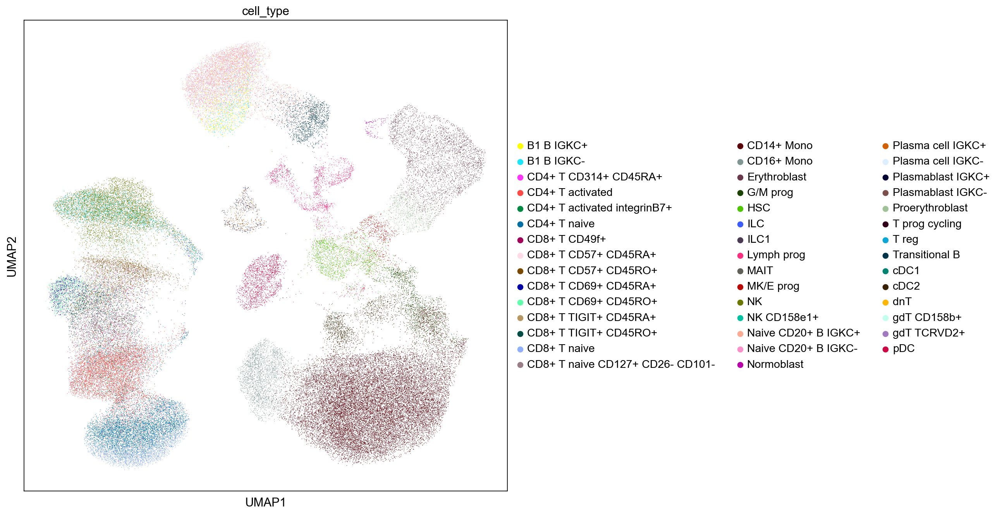

In [30]:
#Whole Neurips dataset plotted

sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(adata_neurips, color = ['cell_type'], color_map = 'viridis')

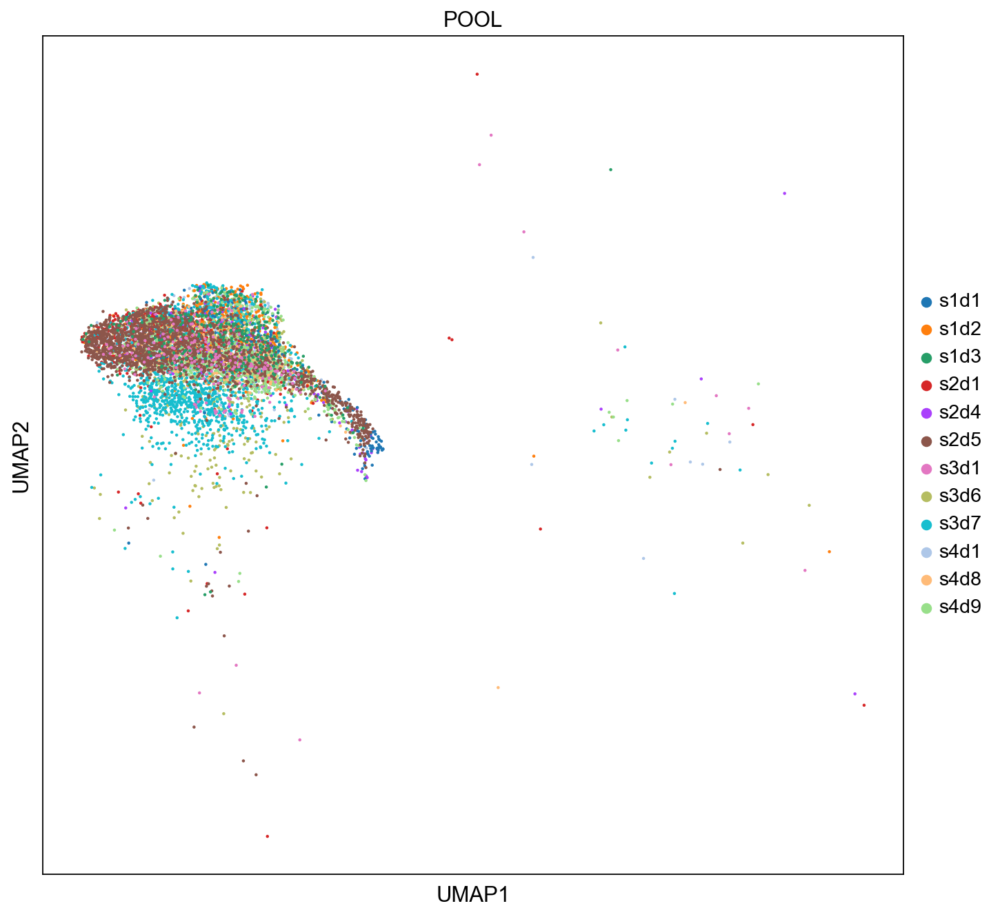

In [31]:
# NK cells from Neurips dataset, coloured by samples

sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(neurips_nk, color = ['POOL'])

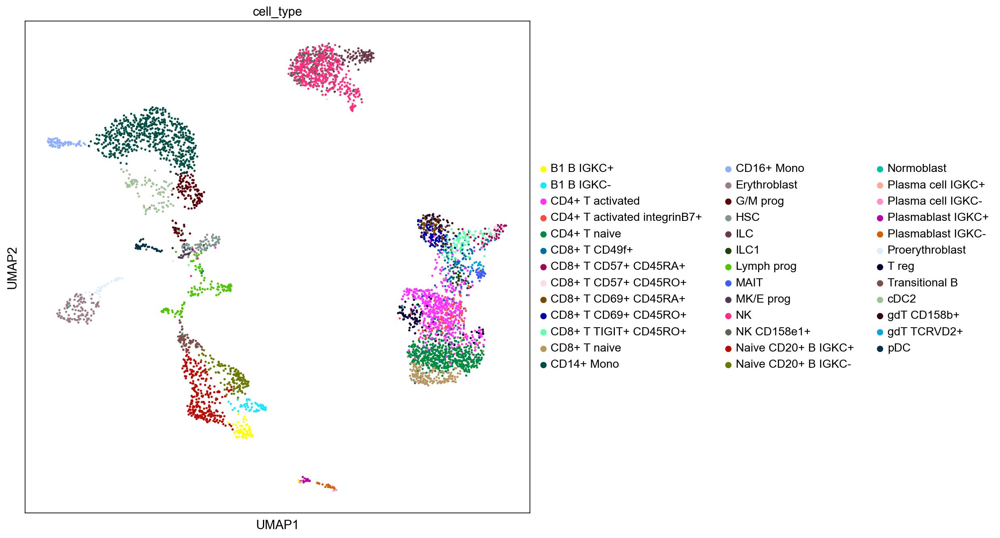

In [32]:
#Only selected sample

sc.set_figure_params(figsize=(10, 10))


sc.pl.umap(eg, color = ['cell_type'], color_map = 'viridis')

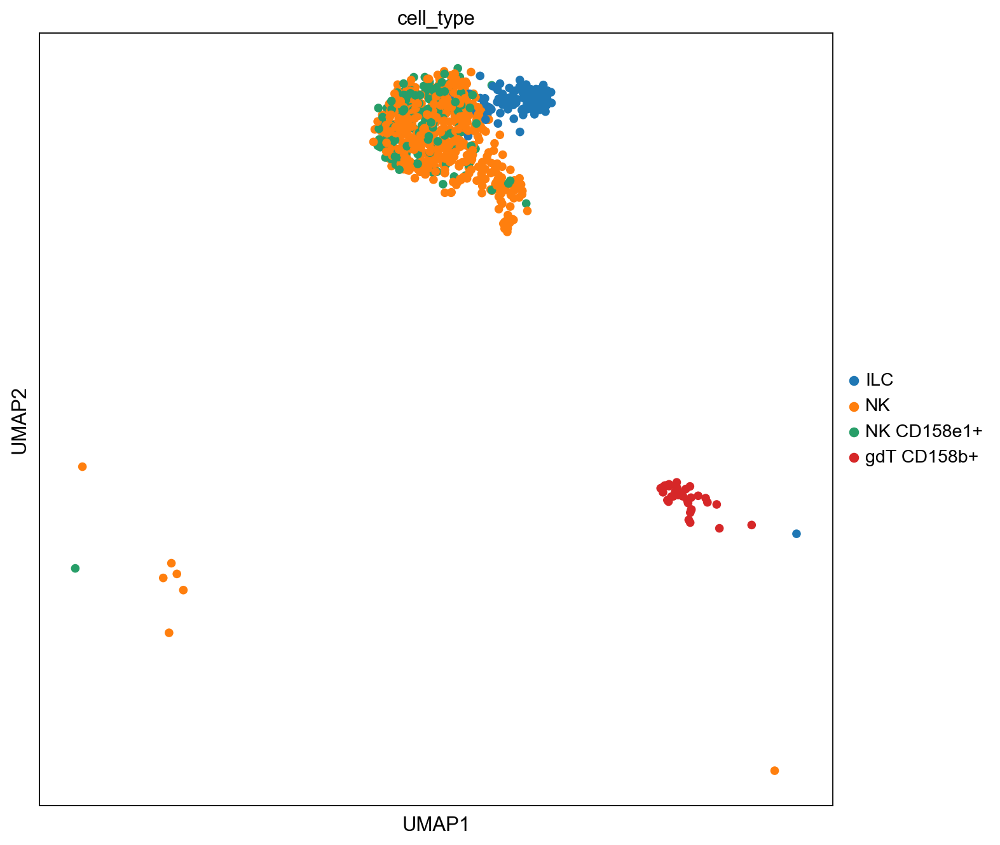

In [33]:
#NK, gd T cells and ILCs from selected sample

sc.pl.umap(sample_nk, color = ['cell_type'], color_map = 'viridis')

## Markers by Melsen et al.

- scRNA-seq, bone marrow. CD56, CXCR6, CD117 and CD34 oligonucleotide-conjugated antibodies were used
- healthy donors, 1 BM transplant recipient


- 8 NK cell cluster were defined
- Clusters 1 and 7 represent the most mature CD56bright NK cells (83% of cells belong to cluster 1, which was further divided into 7 subgroups).
- Cluster 4 the most immature CD56bright NK cells 
- Cluster 2 tissue-resident NK cells
- Cluster 5 non-cytotoxic innate lymphoid cells (ILCs)
- Cluster 6 proliferating NK cells
- Cluster 8 CD56- and CD16+ NK cells with reduced effector function
- Cluster 3 = CD34+, CD117+


- Generally, inhibitory KIRs more frequently expressed in terminally differentiated cells, but in this study were not in top5 DE genes. 
- When comparing to other datasets,  CD56- NK cells not found (probably donor specific). The CD34+ and ltNK cells were barely detected in blood (likely bone-marrow resident). 
- New identified cluster 2, CD56dim GZMK+. Likely intermediate state between CD56bright and CD56dim


- pseudotime analysis of terminally differentiated cells : FGFBP2, PRF1,GZMB, GZMK. Shift from granzyme K to granzyme B during differentiation. 

In [34]:
#Used to check which genes were measured

listOfmarkers= tr_mels
tr_mels = []

for x in listOfmarkers:
    if x in adata_neurips.var_names:
        tr_mels.append(x)

print(tr_mels)

NameError: name 'tr_mels' is not defined

In [ ]:
#Used to check which markers were measured


listOfmarkers= ['CD160']


for x in listOfmarkers:
    if x in prot.columns:
        print(x)


## 1. CD56bright immature NK cells (cluster 4 in the paper)

CD56bright NK cells, RNA, NCAM1= CD56, KIT = CD117


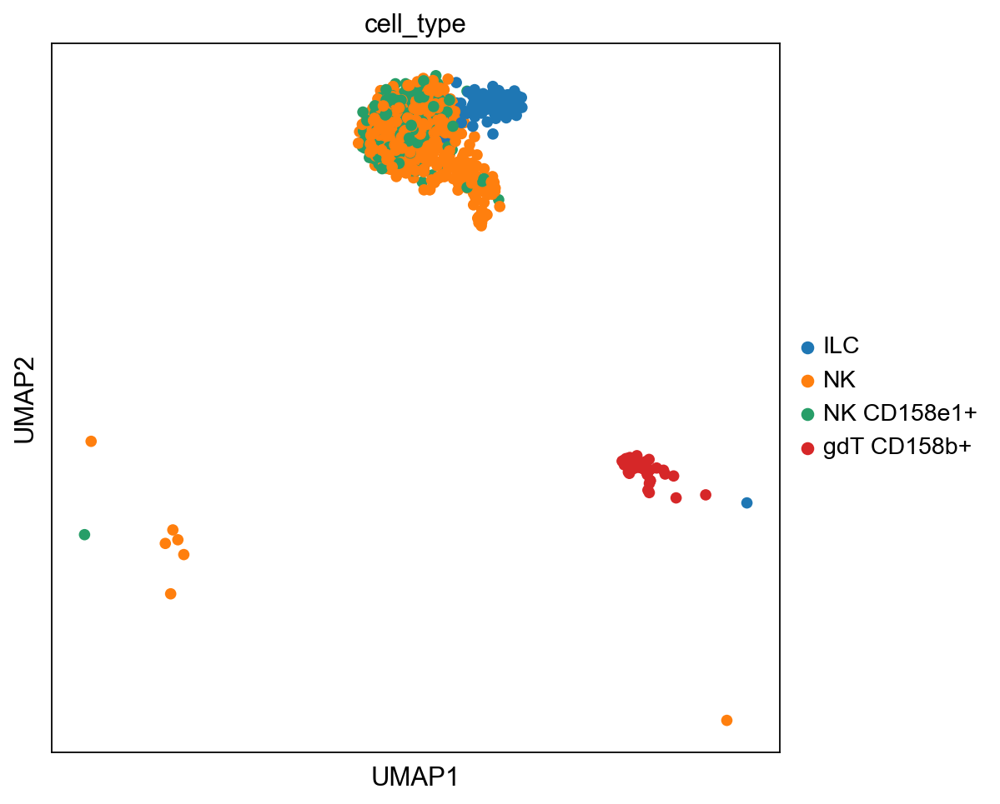

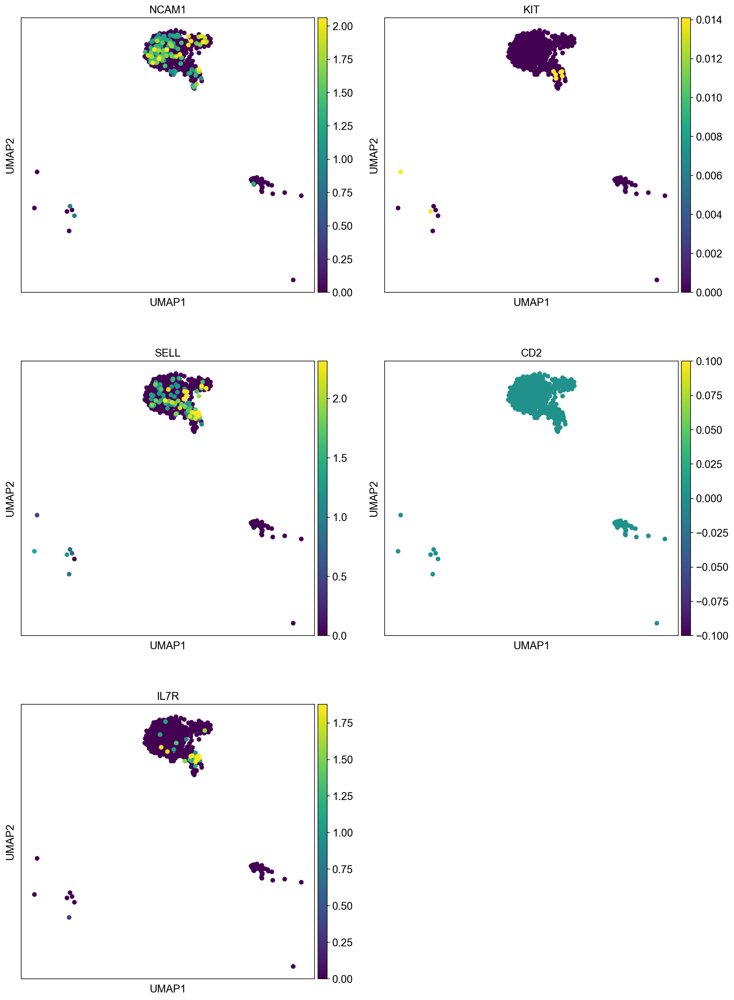

CD56bright NK cells, proteins


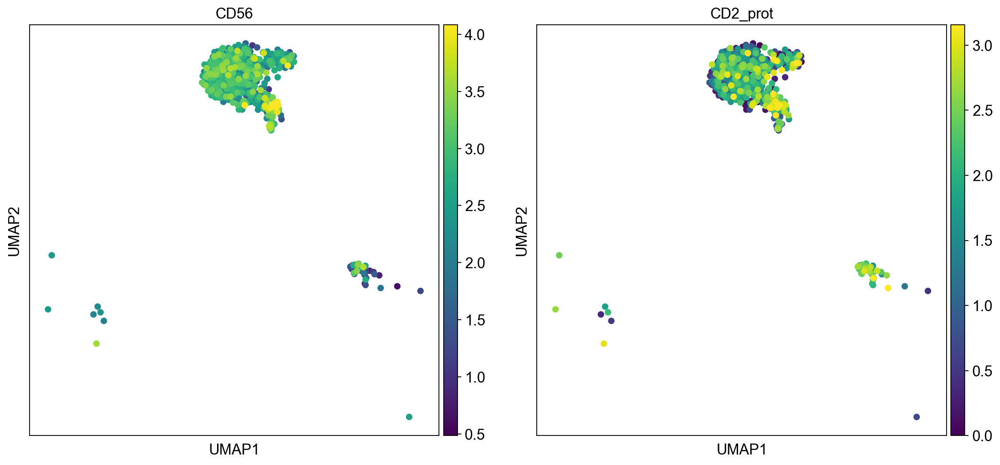

In [35]:

cd56bright_mels = ['NCAM1', 'KIT', 'SELL', 'CD2', 'IL7R']

cd56bright_mels_prot= ['CD56', "CD2_prot"]

sc.set_figure_params(figsize=(7, 7))

#RNA
print("CD56bright NK cells, RNA, NCAM1= CD56, KIT = CD117")

sc.pl.umap(sample_nk, color = ['cell_type'], color_map = 'viridis')

sc.pl.umap(sample_nk, color = cd56bright_mels, vmax="p99", color_map = 'viridis', ncols=2)

#Surface protein
print("CD56bright NK cells, proteins")

sc.pl.umap(sample_nk, color = cd56bright_mels_prot, vmax="p99", color_map = 'viridis', ncols=2)



RNA, NCAM1= CD56, KIT = CD117


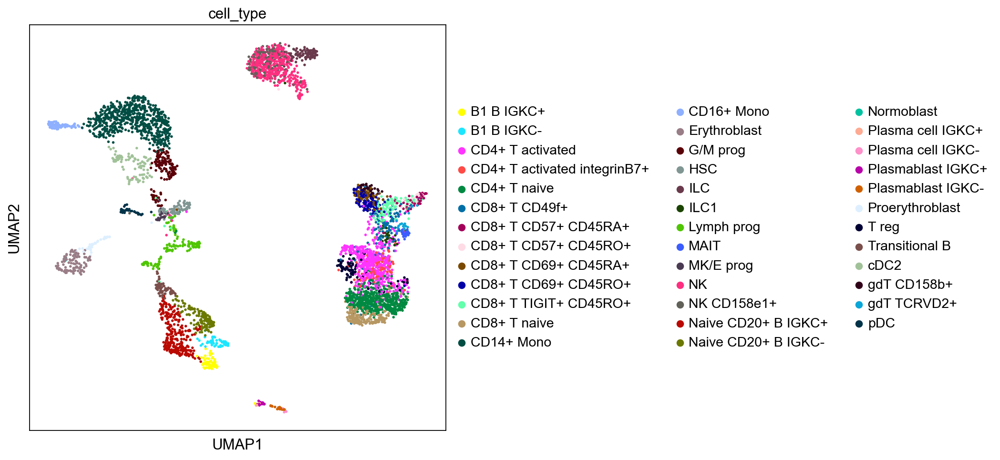

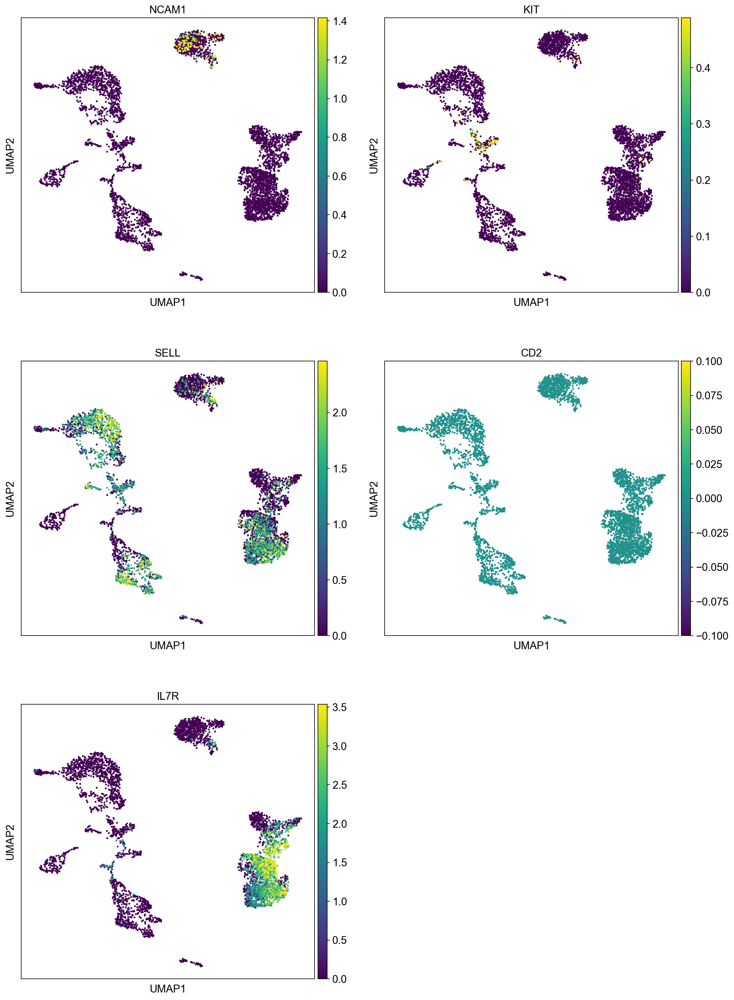

Surface proteins


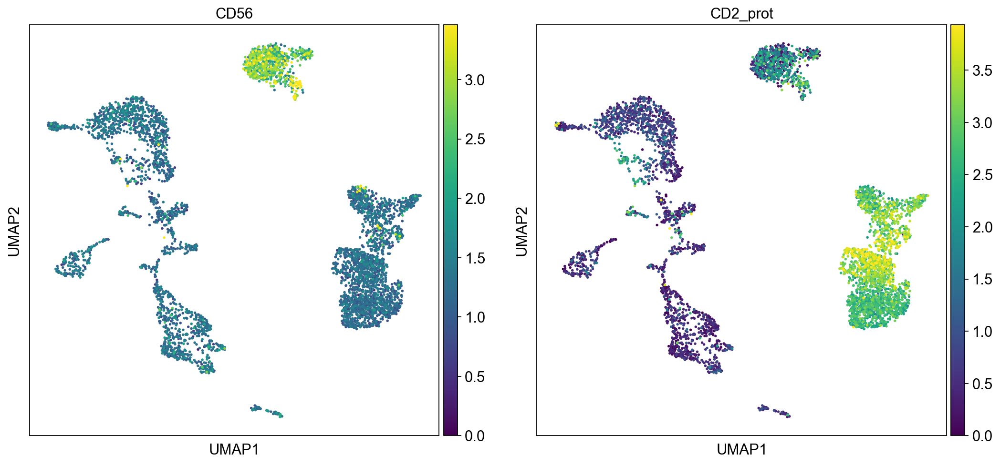

In [36]:

cd56bright_mels = ['NCAM1', 'KIT', 'SELL', 'CD2', 'IL7R']

cd56bright_mels_prot= ['CD56', "CD2_prot"]

sc.set_figure_params(figsize=(7, 7))

#RNA
print("RNA, NCAM1= CD56, KIT = CD117")

sc.pl.umap(eg, color = ['cell_type'], color_map = 'viridis')

sc.pl.umap(eg, color = cd56bright_mels, vmax="p99", color_map = 'viridis', ncols=2)

#Surface protein
print("Surface proteins")

sc.pl.umap(eg, color = cd56bright_mels_prot, vmax="p99", color_map = 'viridis', ncols=2)




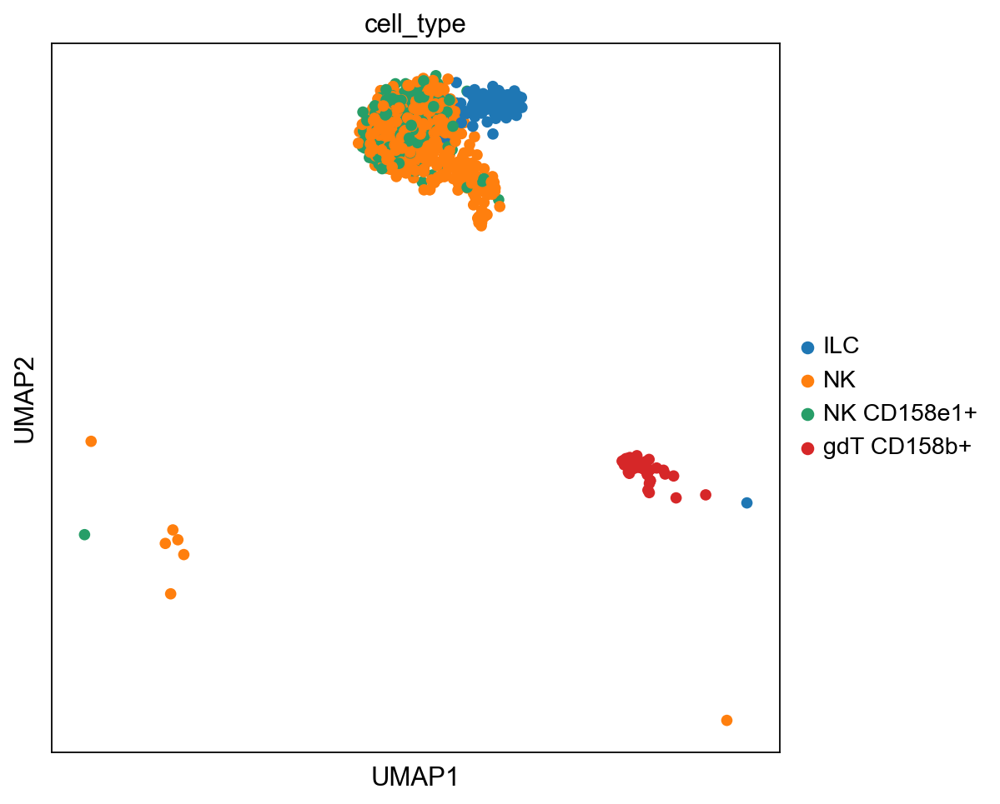

RNA


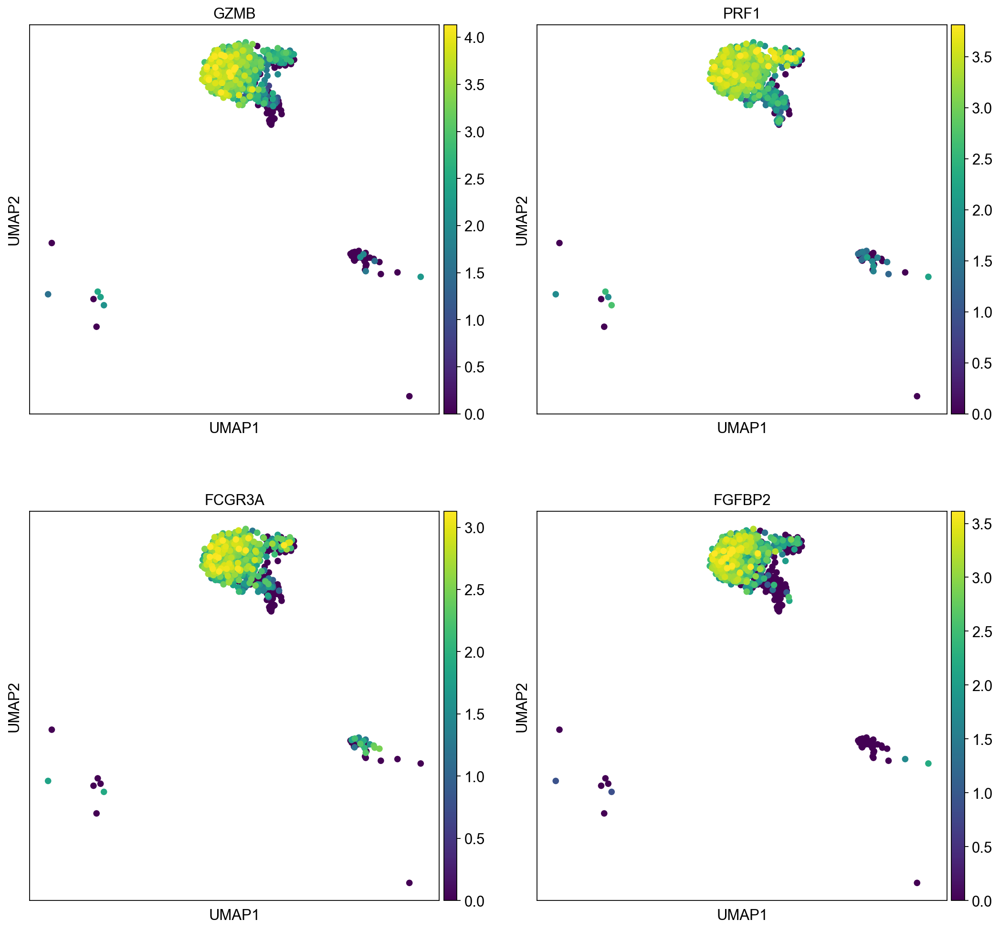

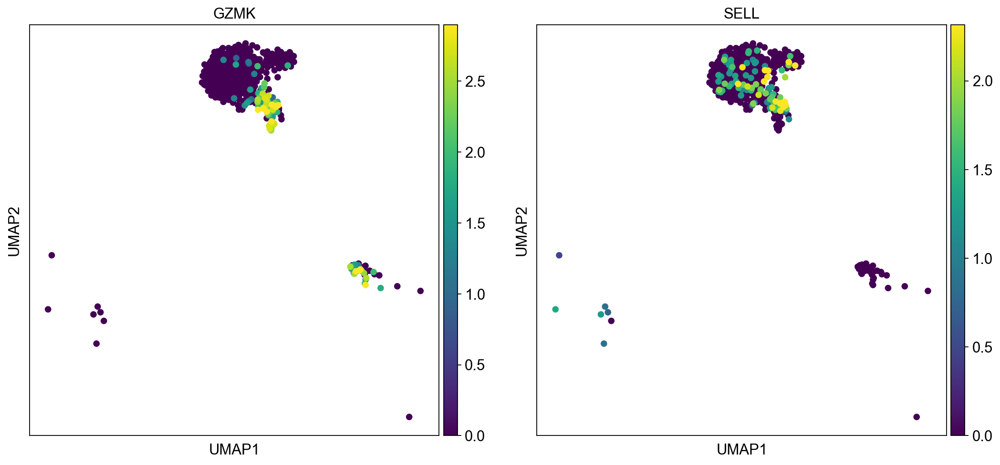

surface protein, FCGR3A=CD16, SELL=CD62L


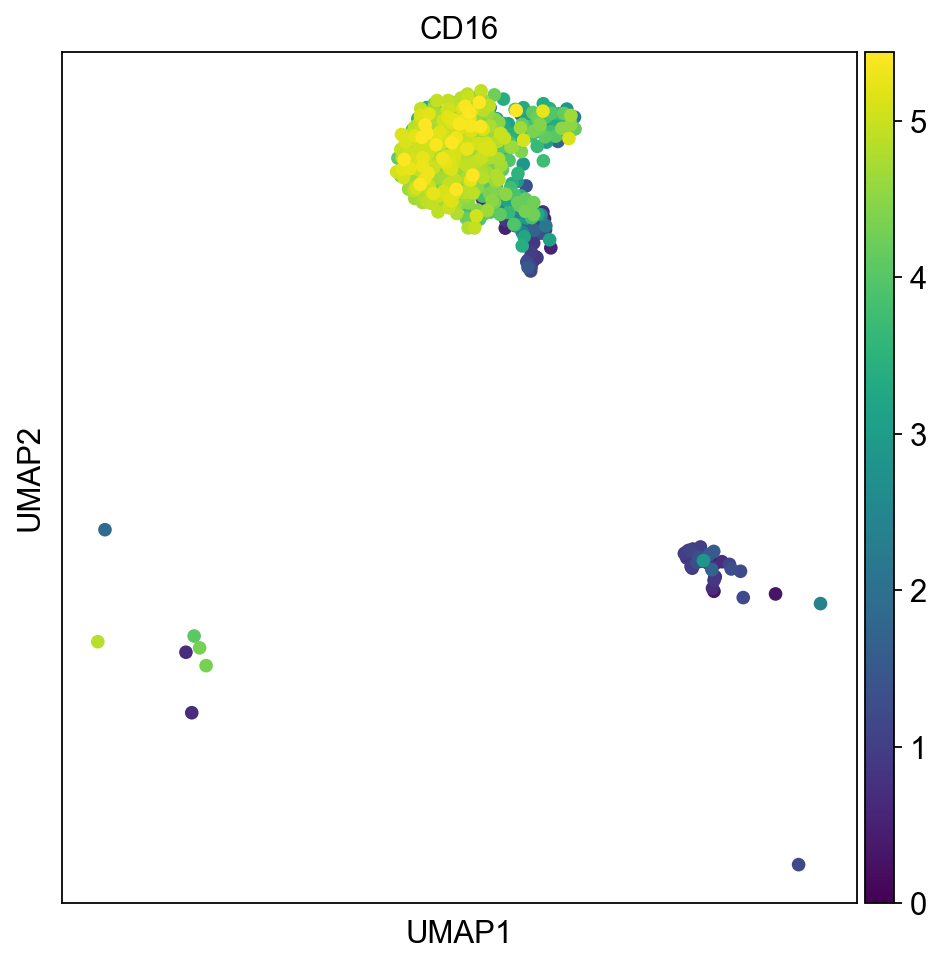

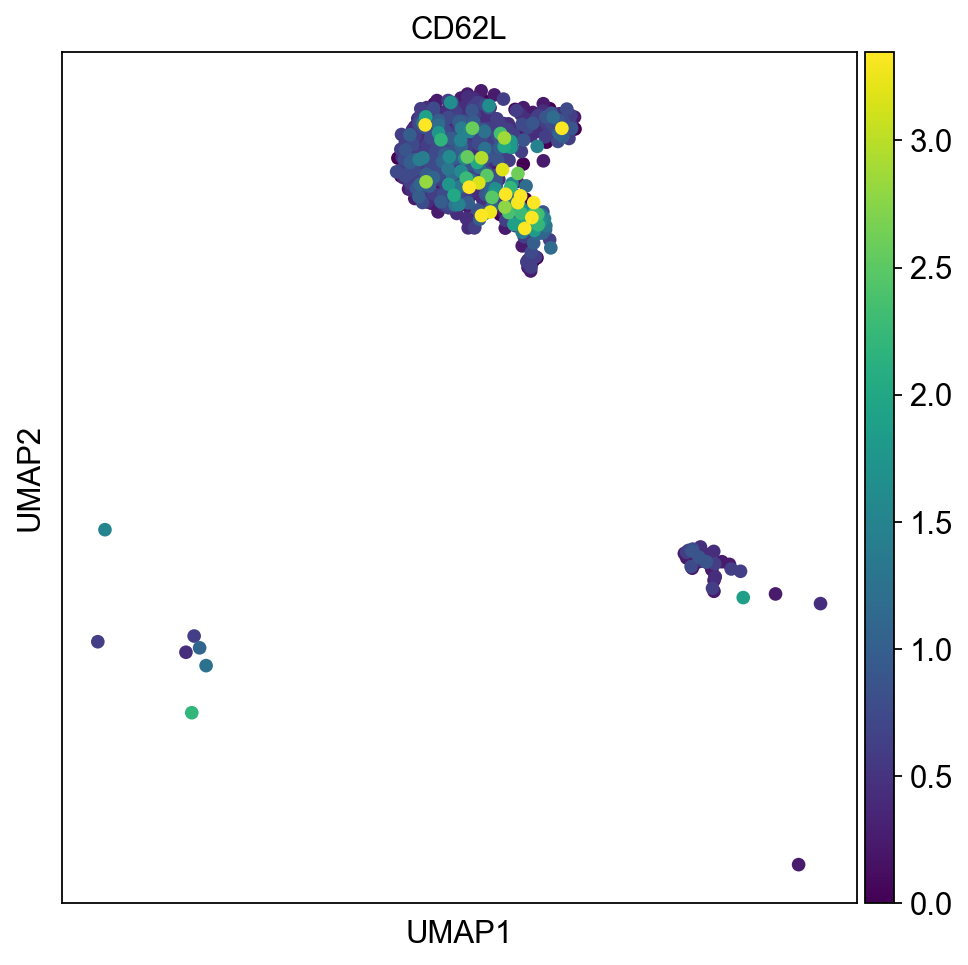

In [37]:
#Two CD56dim populations (adaptive NK cells) identified, clusters 1 and 7 defined in the paper

cd56dim_mels_1= ['GZMB', 'PRF1', 'FCGR3A', 'FGFBP2']
cd56dim_mels_2 = ['GZMK', 'SELL'] #higher expression of these markers


cd56dim_mels_1_prot = ['CD16']

cd56dim_mels_2_prot  = ['CD62L'] #intermediate state between CD56bright and CD56dim.

sc.set_figure_params(figsize=(7, 7))

sc.pl.umap(sample_nk, color = ['cell_type'], color_map = 'viridis')

#RNA
print('RNA')
sc.pl.umap(sample_nk, color = cd56dim_mels_1, vmax="p99", color_map = 'viridis', ncols=2)
sc.pl.umap(sample_nk, color = cd56dim_mels_2, vmax="p99", color_map = 'viridis', ncols=2)


print("surface protein, FCGR3A=CD16, SELL=CD62L")

sc.pl.umap(sample_nk, color = cd56dim_mels_1_prot, vmax="p99", color_map = 'viridis', ncols=2)
sc.pl.umap(sample_nk, color = cd56dim_mels_2_prot, vmax="p99", color_map = 'viridis', ncols=2)

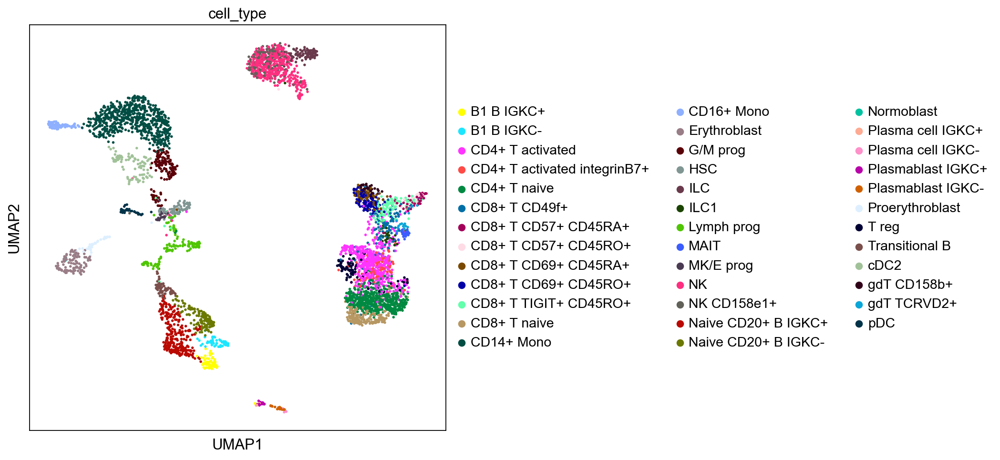

RNA


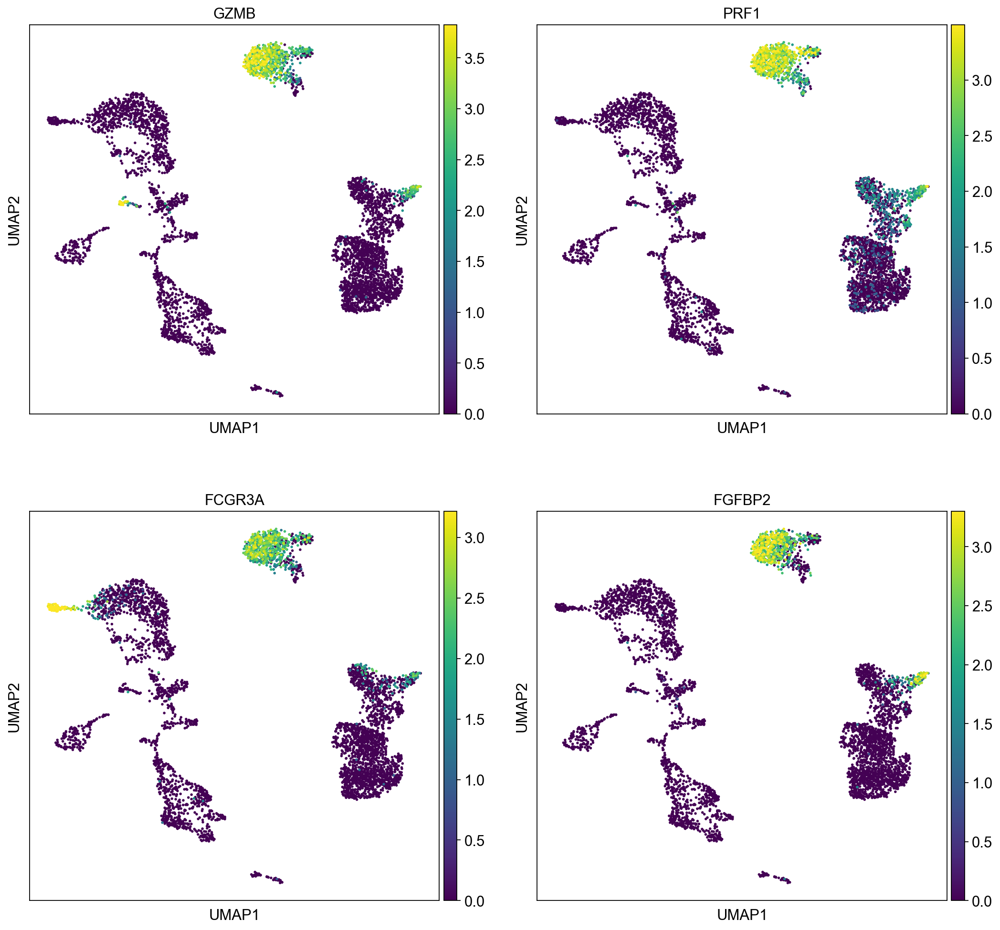

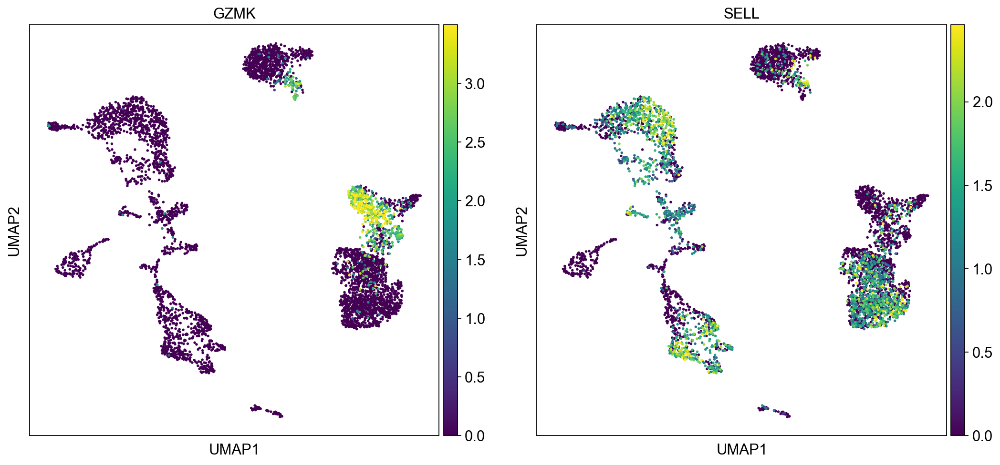

surface protein, FCGR3A=CD16, SELL=CD62L


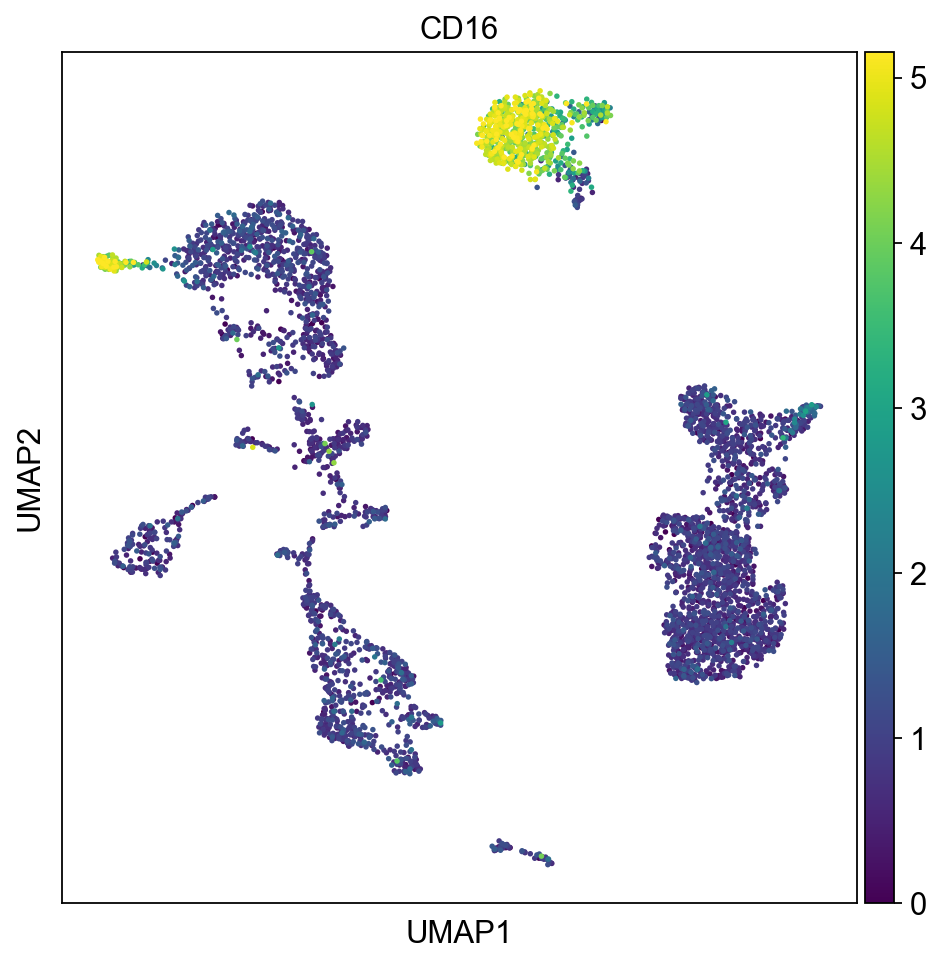

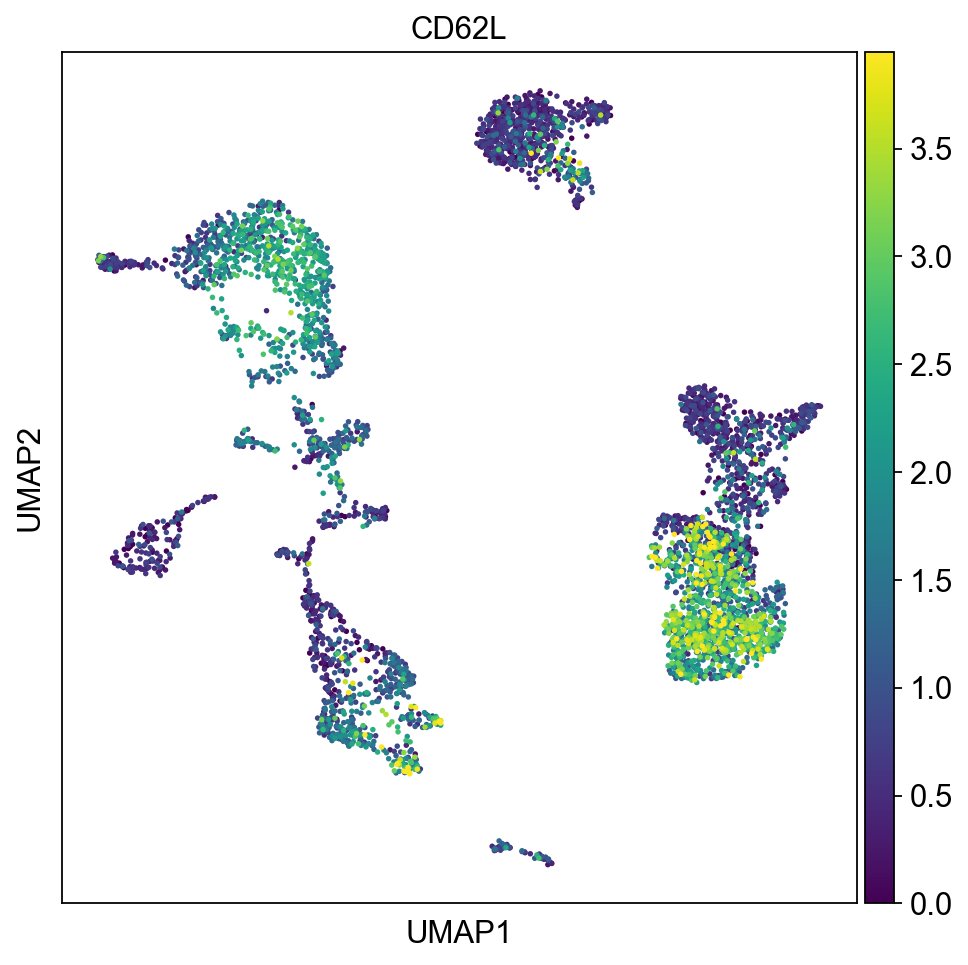

In [38]:
#All cell types

#Two CD56dim populations (adaptive NK cells) identified, clusters 1 and 7 defined in the paper


cd56dim_mels_1= ['GZMB', 'PRF1', 'FCGR3A', 'FGFBP2']

cd56dim_mels_2 = ['GZMK', 'SELL'] #higher expression of these markers

cd56dim_mels_1_prot = ['CD16']

cd56dim_mels_2_prot  = ['CD62L'] #intermediate state between CD56bright and CD56dim.

sc.set_figure_params(figsize=(7, 7))

sc.pl.umap(eg, color = ['cell_type'], color_map = 'viridis')

#RNA
print('RNA')
sc.pl.umap(eg, color = cd56dim_mels_1, vmax="p99", color_map = 'viridis', ncols=2)
sc.pl.umap(eg, color = cd56dim_mels_2, vmax="p99", color_map = 'viridis', ncols=2)


print("surface protein, FCGR3A=CD16, SELL=CD62L")

sc.pl.umap(eg, color = cd56dim_mels_1_prot, vmax="p99", color_map = 'viridis', ncols=2)
sc.pl.umap(eg, color = cd56dim_mels_2_prot, vmax="p99", color_map = 'viridis', ncols=2)

## 2. Tissue resident NK cells (cluster 2 in the paper)

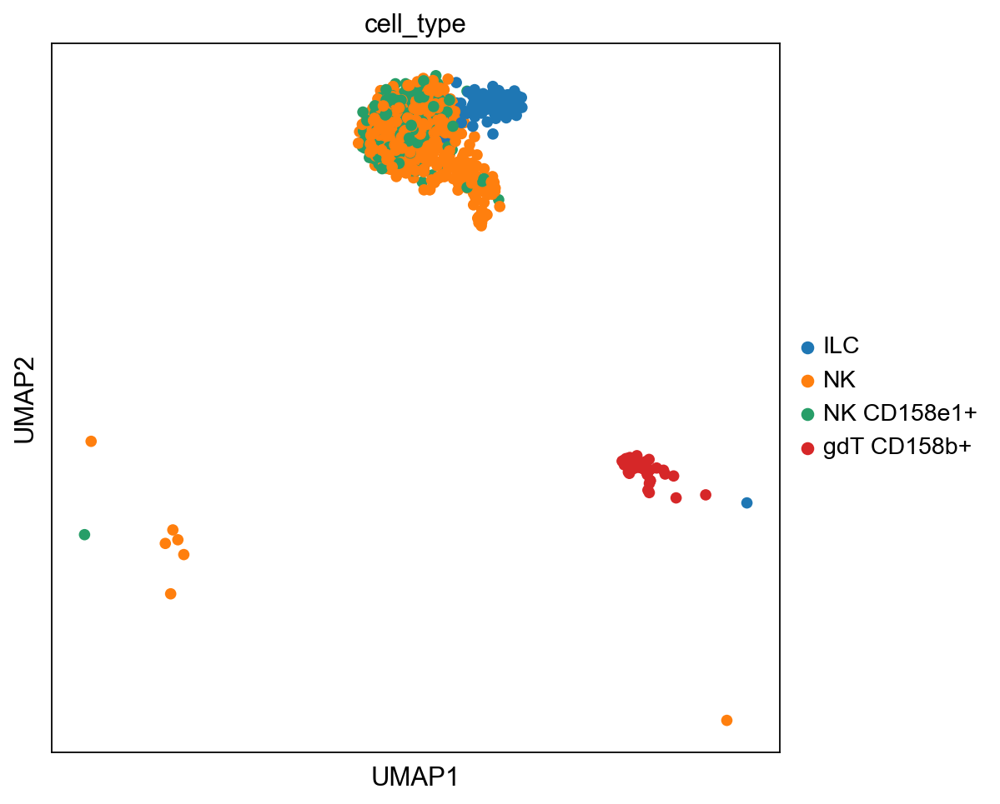

Tissue-resident, RNA


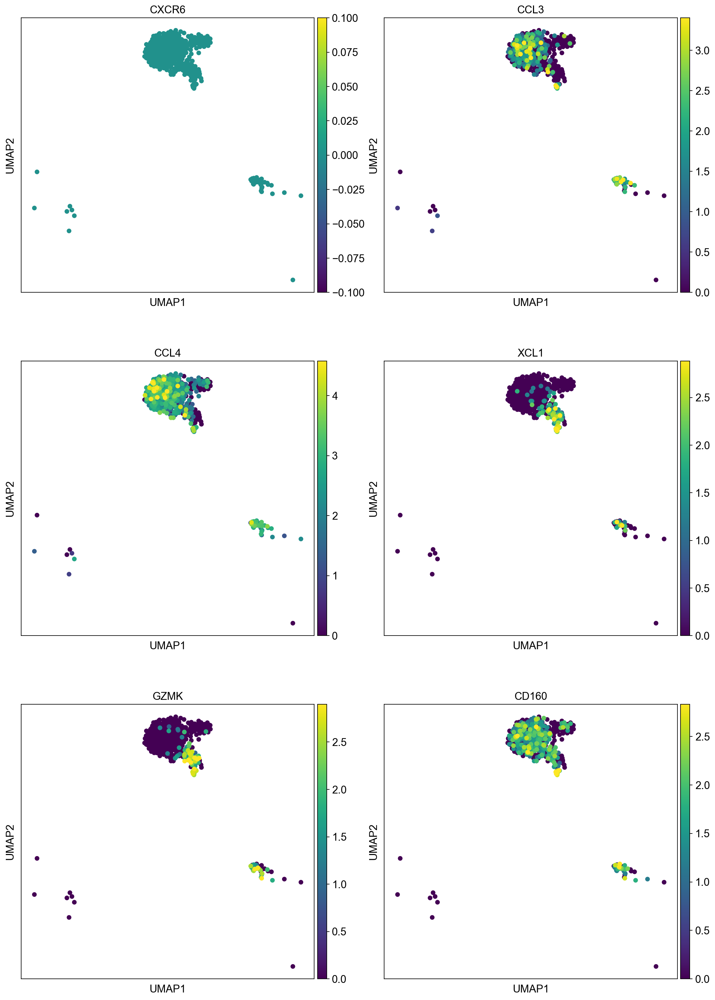

In [39]:
tr_mels= ['CXCR6', 'CCL3', 'CCL4', 'XCL1', 'GZMK', 'CD160']


# No corresponding surface markers 


sc.pl.umap(sample_nk, color = ['cell_type'], color_map = 'viridis')


#RNA
print('Tissue-resident, RNA')
sc.pl.umap(sample_nk, color = tr_mels, vmax="p99", color_map = 'viridis', ncols=2)


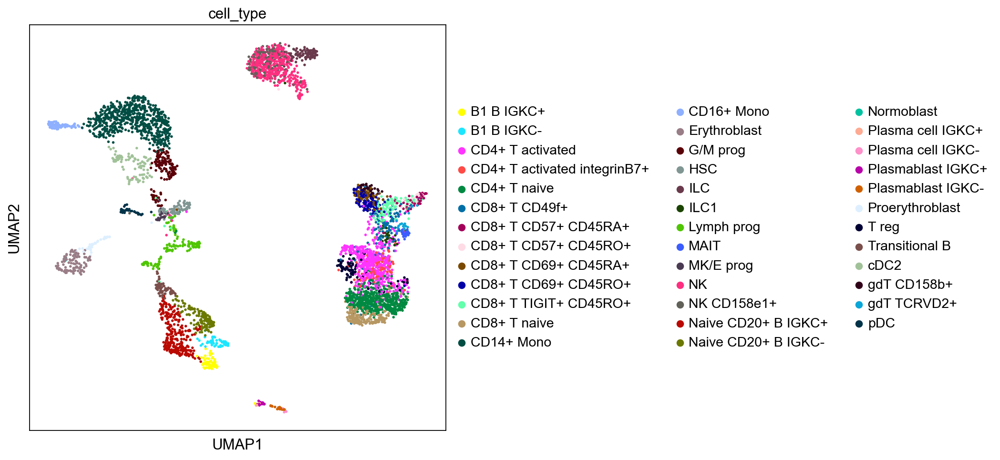

Tissue-resident, RNA


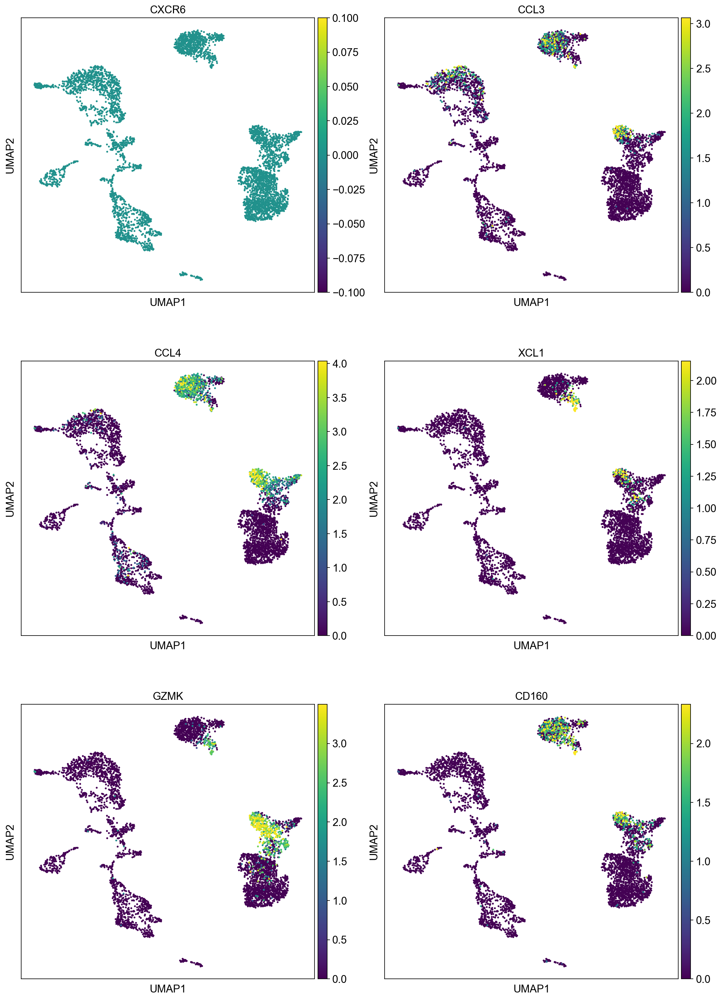

In [40]:
#All cell types

# Tissue resident NK cells, cluster 2 in the paper

tr_mels= ['CXCR6', 'CCL3', 'CCL4', 'XCL1', 'GZMK', 'CD160']


# No corresponding surface markers 


sc.pl.umap(eg, color = ['cell_type'], color_map = 'viridis')


#RNA
print('Tissue-resident, RNA')
sc.pl.umap(eg, color = tr_mels, vmax="p99", color_map = 'viridis', ncols=2)



## 3. Non-cytotoxic innate lymphoid cells (ILCs, cluster 5 in the paper) 

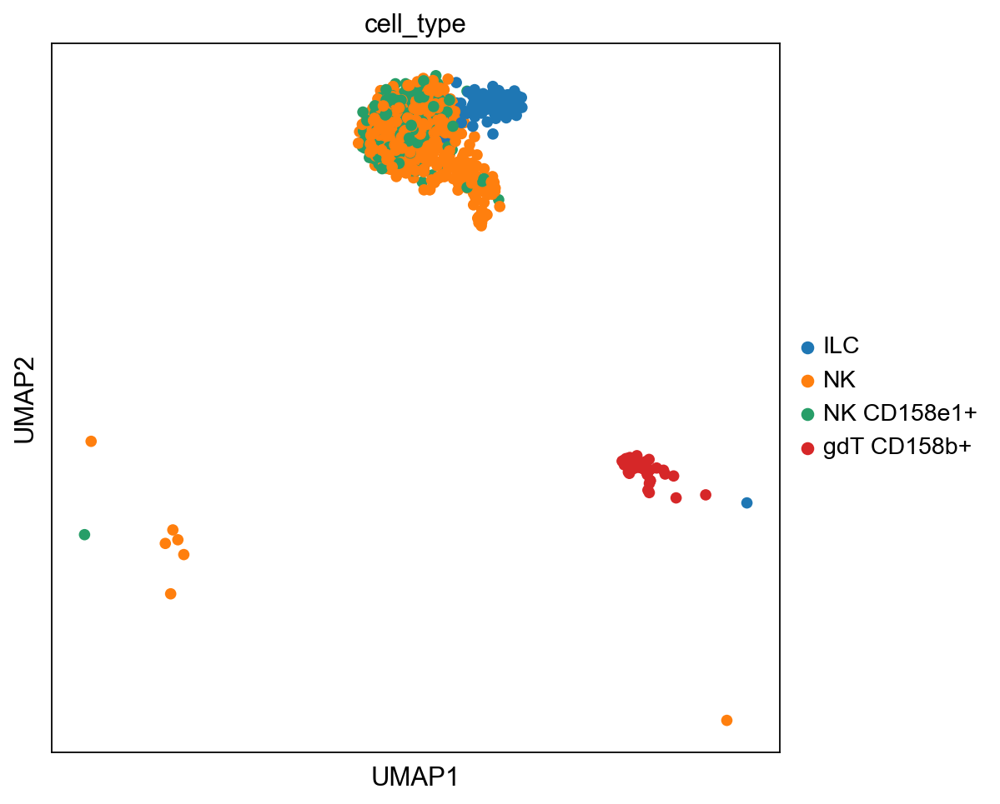

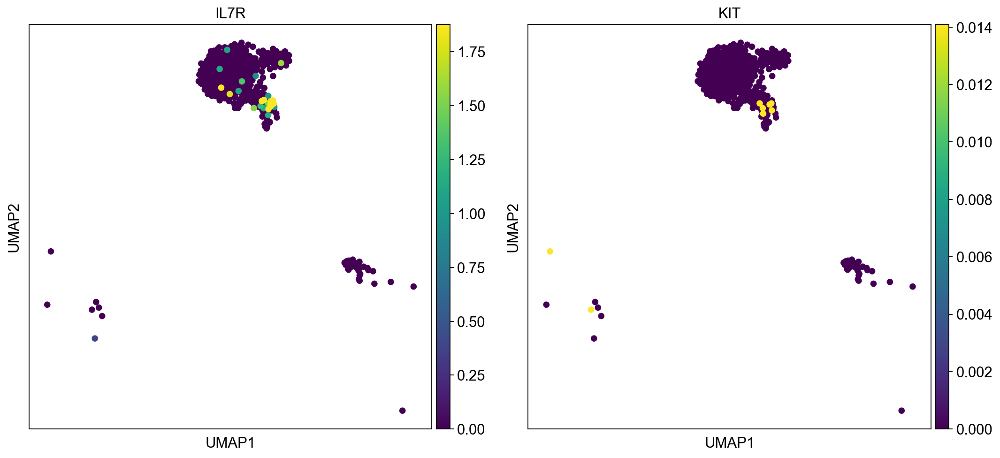

In [101]:

# "The absence of NKG7, and high expression of IL7R suggests that these cells are non-cytotoxic innate lymphoid cells"

ILC_mels = ['IL7R', 'KIT'] 

#KIT = CD117 (not included in antibody panel)

sc.set_figure_params(figsize=(7, 7))

sc.pl.umap(sample_nk, color = ['cell_type'], color_map = 'viridis')

#RNA
sc.pl.umap(sample_nk, color = ILC_mels, vmax="p99", color_map = 'viridis', ncols=2)



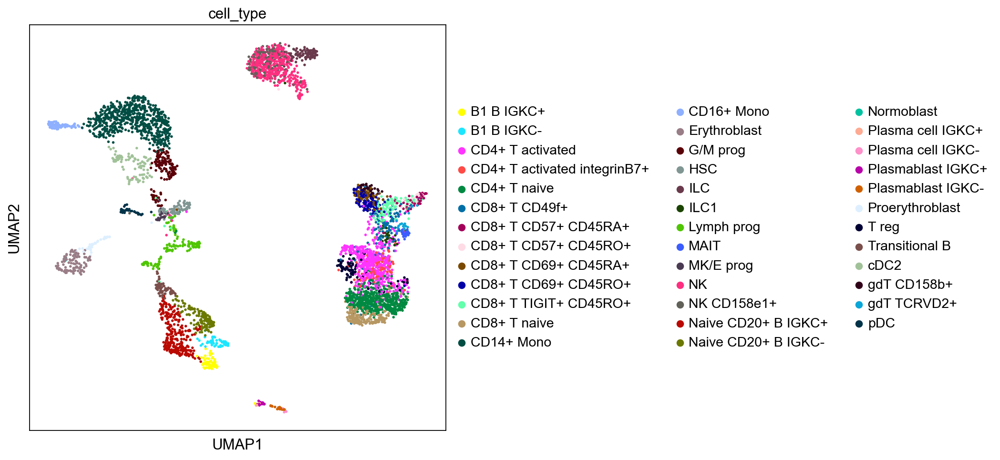

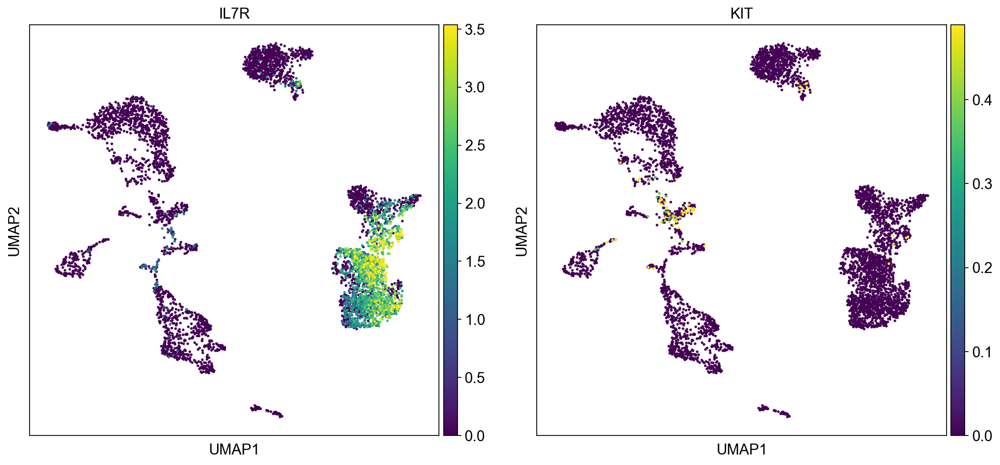

In [102]:
ILC_mels = ['IL7R', 'KIT'] 

#KIT = CD117 (not included in antibody panel)

sc.set_figure_params(figsize=(7, 7))

sc.pl.umap(eg, color = ['cell_type'], color_map = 'viridis')

#RNA
sc.pl.umap(eg, color = ILC_mels, vmax="p99", color_map = 'viridis', ncols=2)




In [103]:

listOfmarkers= prolif_mels
prolif_mels = []

for x in listOfmarkers:
    if x in adata_neurips.var_names:
        prolif_mels.append(x)

print(prolif_mels)

NameError: name 'prolif_mels' is not defined

## 4. Proliferating NK cells (cluster 6 in the paper)

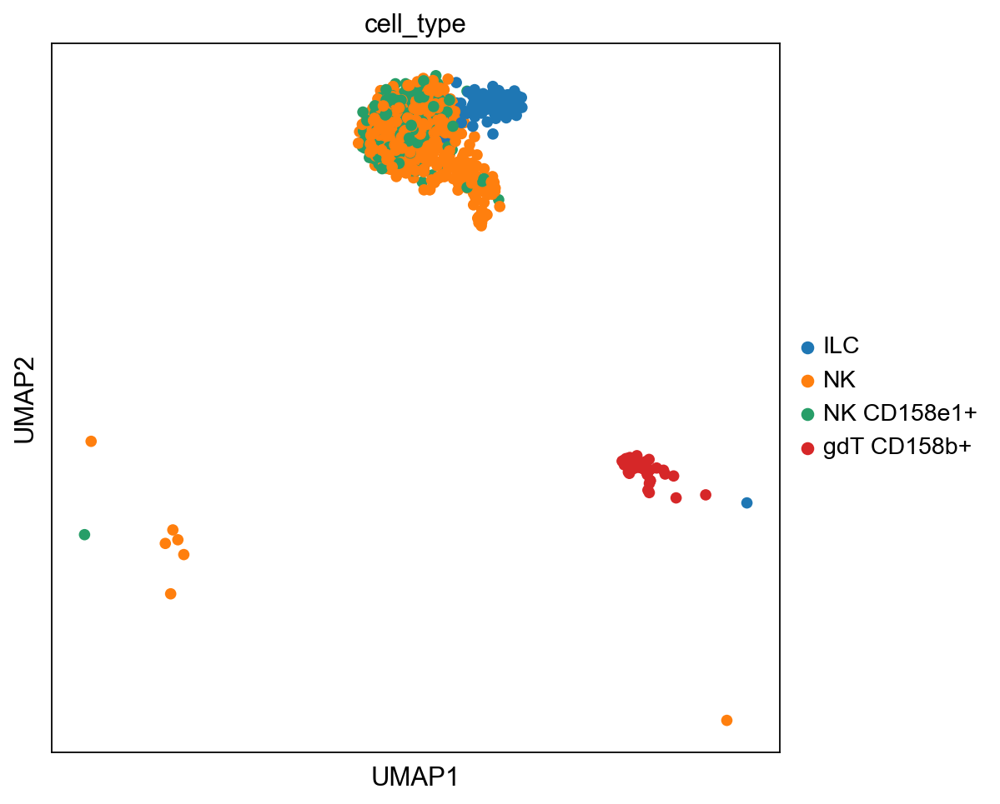

RNA


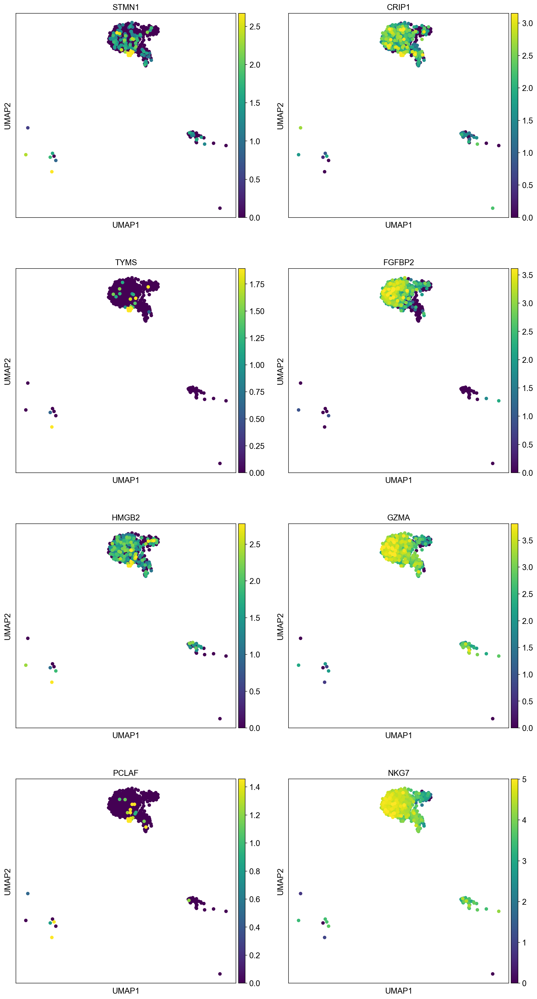

In [109]:
#mixed population of CD56bright and CD56 cells, cluster 6 in the paper

prolif_mels = ['STMN1', 'CRIP1', 'TYMS', 'FGFBP2', 'HMGB2', 'GZMA', 'PCLAF', 'NKG7']

sc.set_figure_params(figsize=(7, 7))
sc.pl.umap(sample_nk, color = ['cell_type'], color_map = 'viridis')

#RNA
print("RNA")

sc.pl.umap(sample_nk, color = prolif_mels, vmax="p99", color_map = 'viridis', ncols=2)

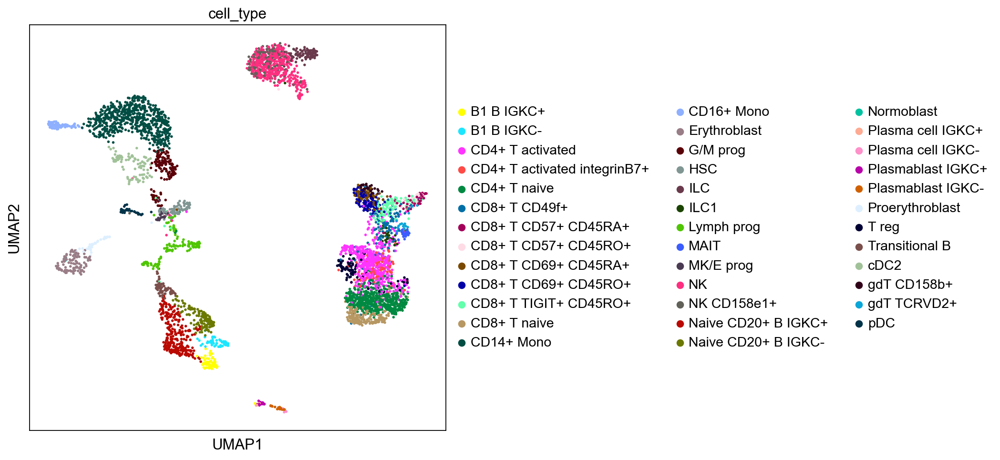

RNA


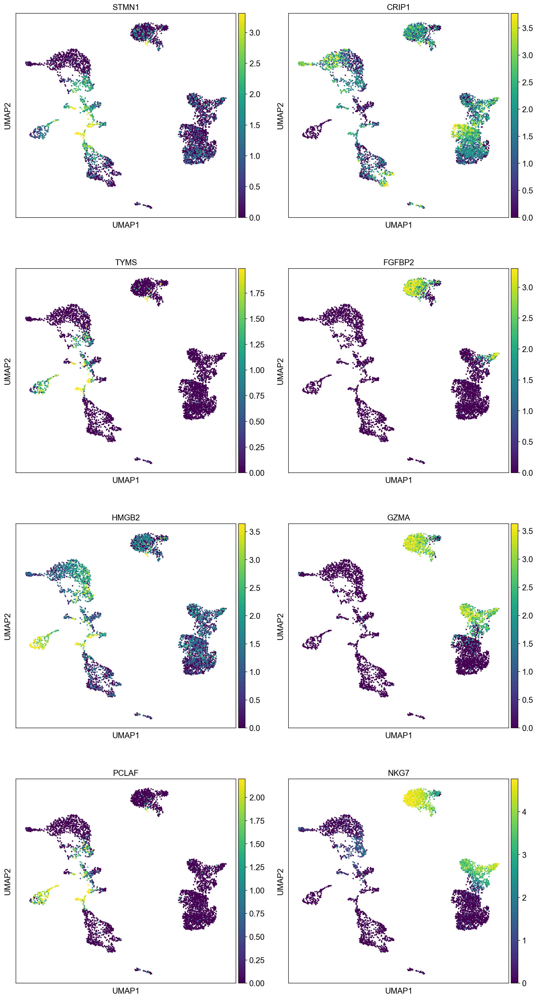

In [110]:
prolif_mels = ['STMN1', 'CRIP1', 'TYMS', 'FGFBP2', 'HMGB2', 'GZMA', 'PCLAF', 'NKG7']

sc.set_figure_params(figsize=(7, 7))
sc.pl.umap(eg, color = ['cell_type'], color_map = 'viridis')

#RNA
print("RNA")

sc.pl.umap(eg, color = prolif_mels, vmax="p99", color_map = 'viridis', ncols=2)

## 5. CD56dim NK cells with reduced effector function (cluster 8 in the paper)

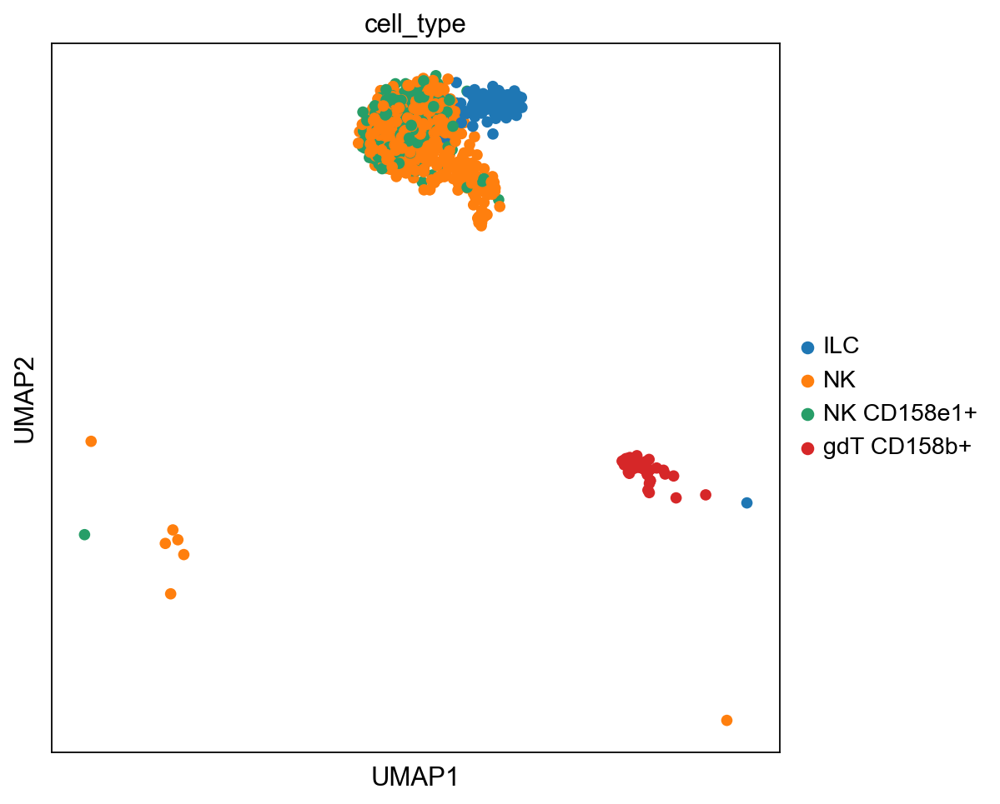

RNA


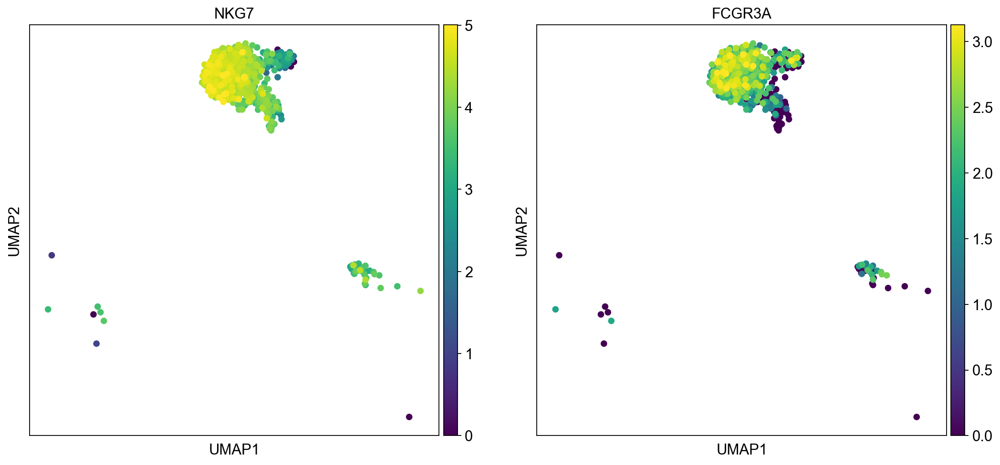

Surface protein, FCGR3A=CD16


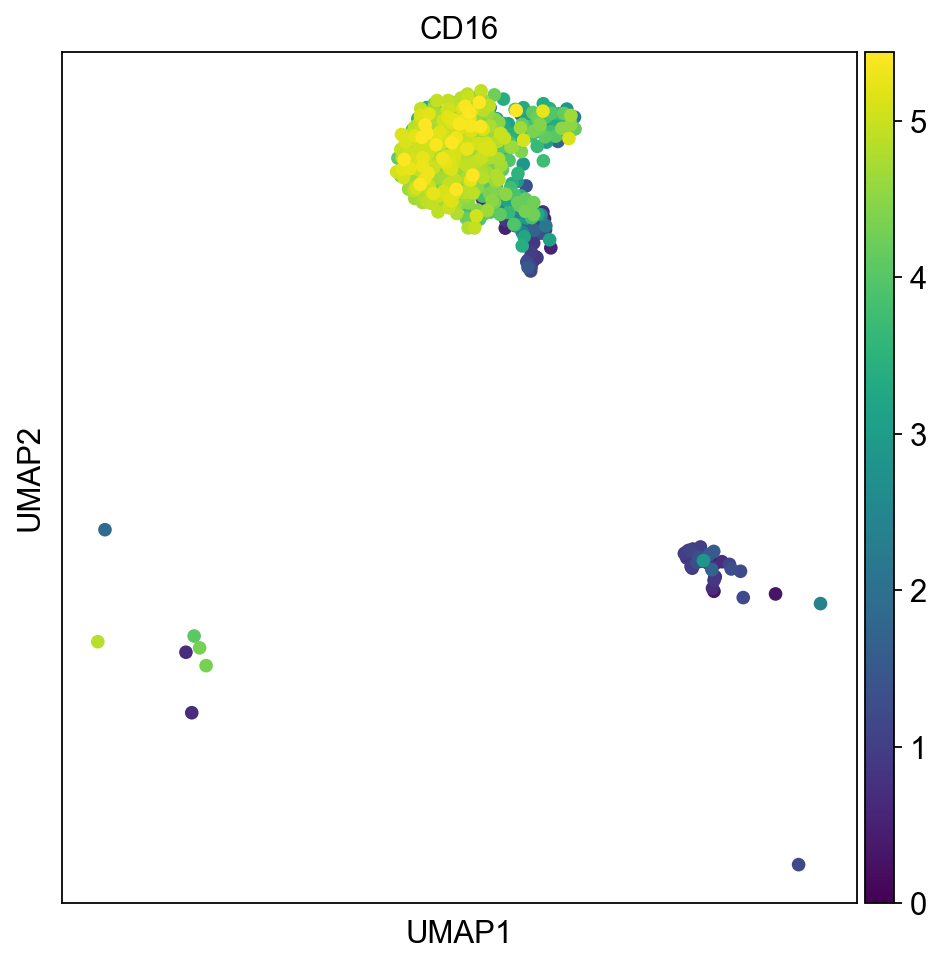

In [111]:
# CD56dim cells with reduced effector function, cluster 8 in the paper

red_eff_mels = ['NKG7', 'FCGR3A']
red_eff_mels_prot = ['CD16']

sc.pl.umap(sample_nk, color = ['cell_type'], color_map = 'viridis')

#RNA
print("RNA")

sc.pl.umap(sample_nk, color = red_eff_mels , vmax="p99", color_map = 'viridis', ncols=2)

#Surface proteins 
print("Surface protein, FCGR3A=CD16")

sc.pl.umap(sample_nk, color = red_eff_mels_prot , vmax="p99", color_map = 'viridis', ncols=2)




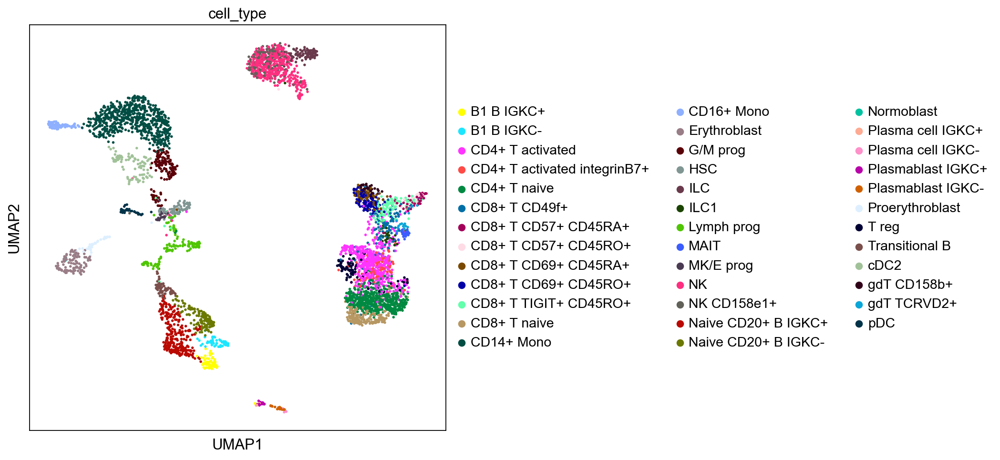

RNA


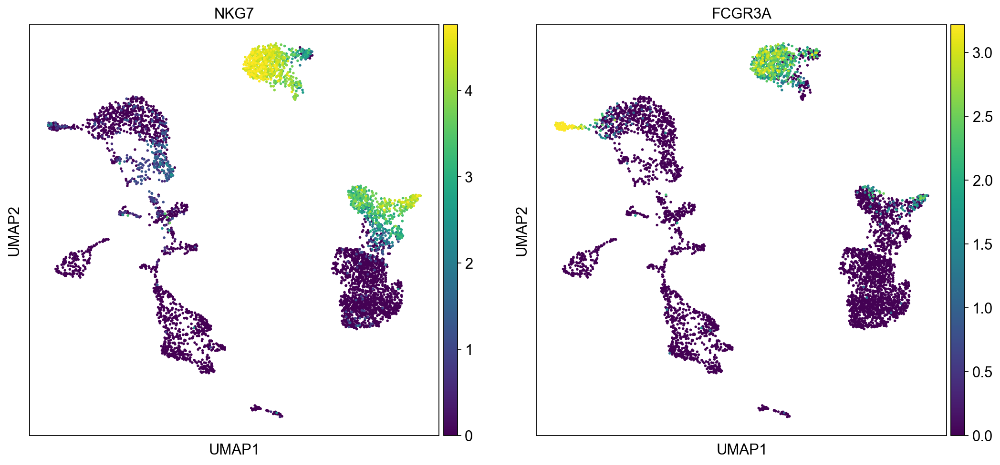

Surface protein, FCGR3A=CD16


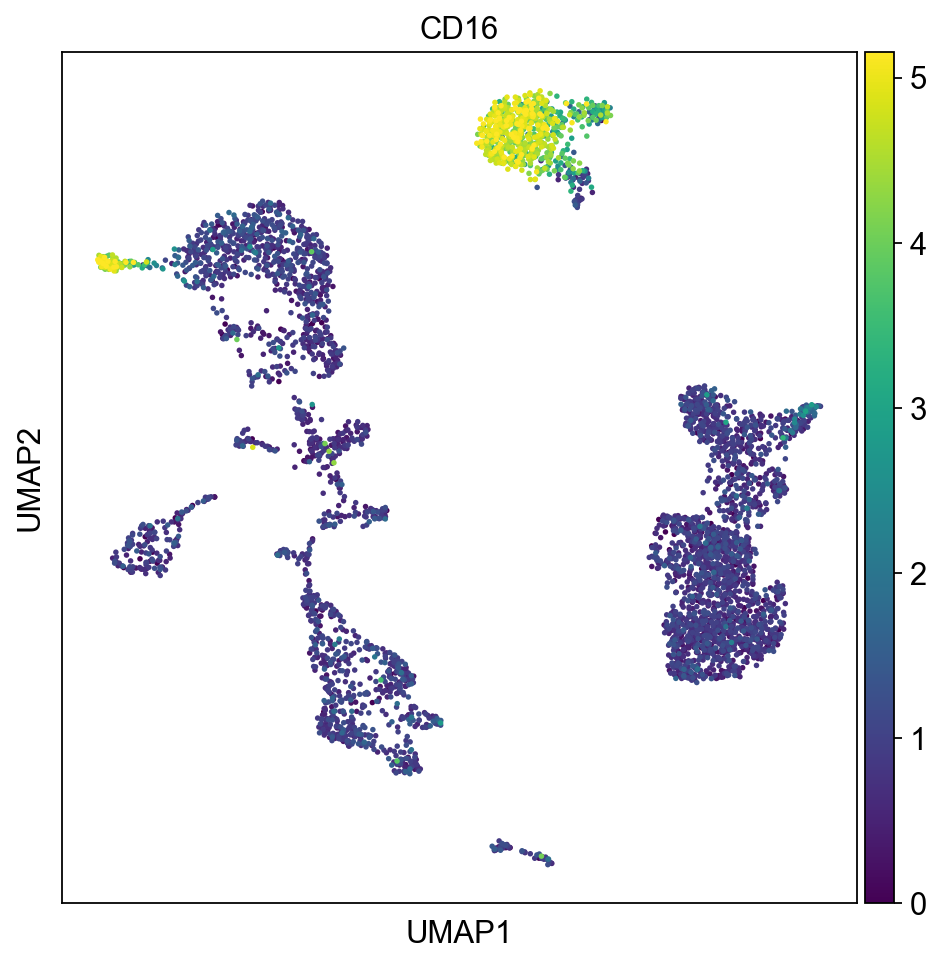

In [112]:
red_eff_mels = ['NKG7', 'FCGR3A']
red_eff_mels_prot = ['CD16']

sc.pl.umap(eg, color = ['cell_type'], color_map = 'viridis')

#RNA
print("RNA")

sc.pl.umap(eg, color = red_eff_mels , vmax="p99", color_map = 'viridis', ncols=2)

#Surface proteins 
print("Surface protein, FCGR3A=CD16")

sc.pl.umap(eg, color = red_eff_mels_prot , vmax="p99", color_map = 'viridis', ncols=2)




## 3.  Precursors (cluster 3 in the paper)

RNA


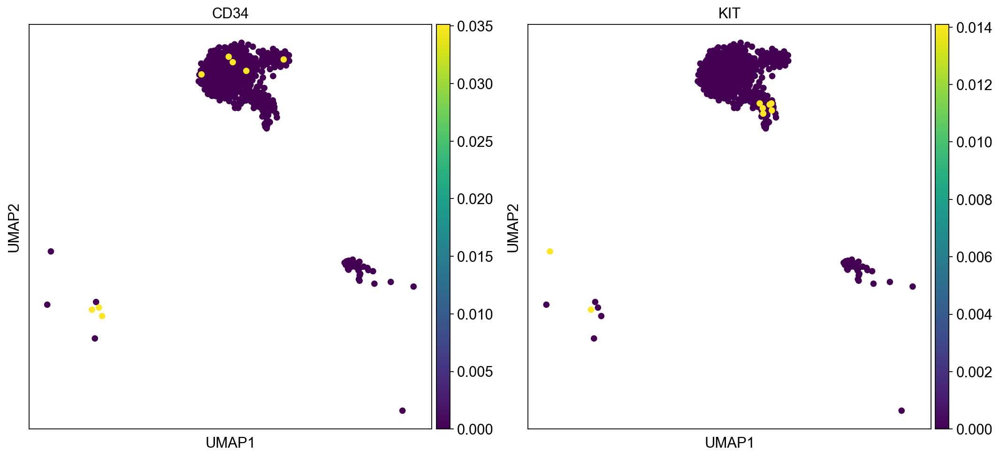

Surface protein


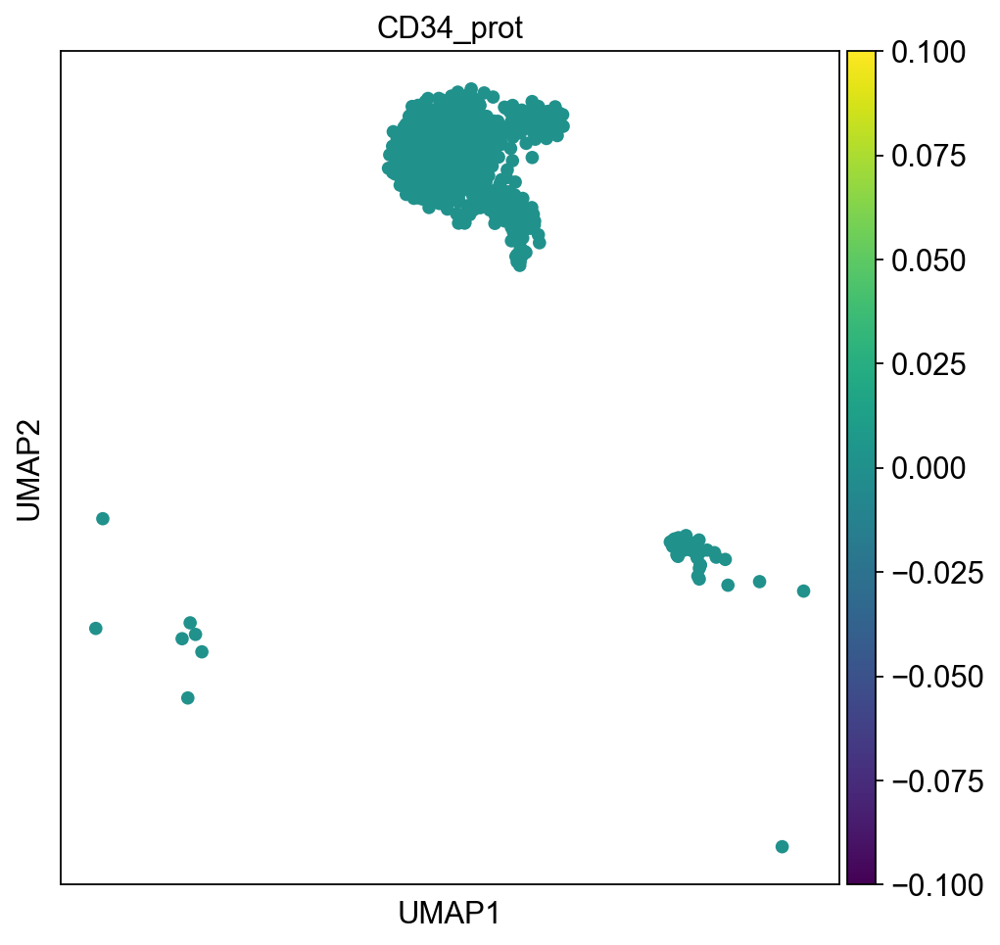

In [117]:
#Cluster 3, precursors? 

#RNA
print('RNA')
clust3_mels = ['CD34', 'KIT']

sc.pl.umap(sample_nk, color = clust3_mels , vmax="p99", color_map = 'viridis', ncols=2)

#Surface proteins
# KIT=CD117, was not used in the antibody panel

print("Surface protein")

clust3_mels_prot = ['CD34_prot']

sc.pl.umap(sample_nk, color = clust3_mels_prot , vmax="p99", color_map = 'viridis', ncols=2)



RNA


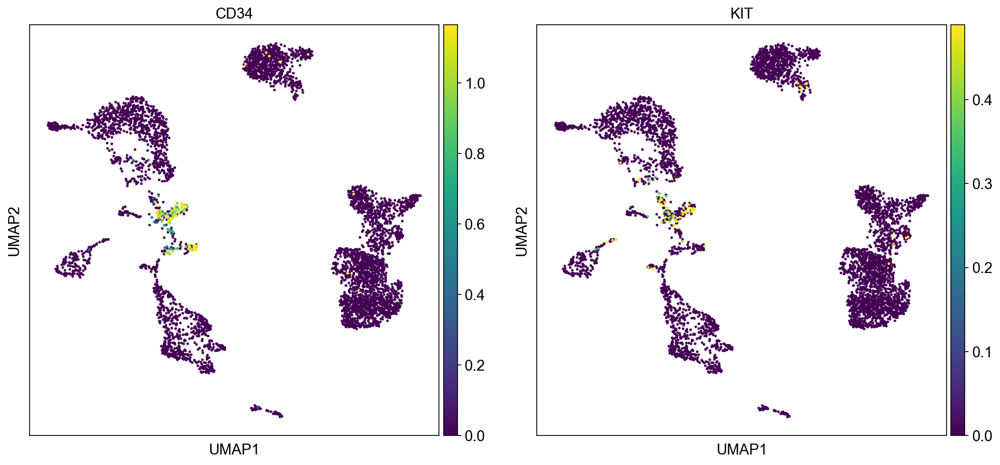

Surface protein


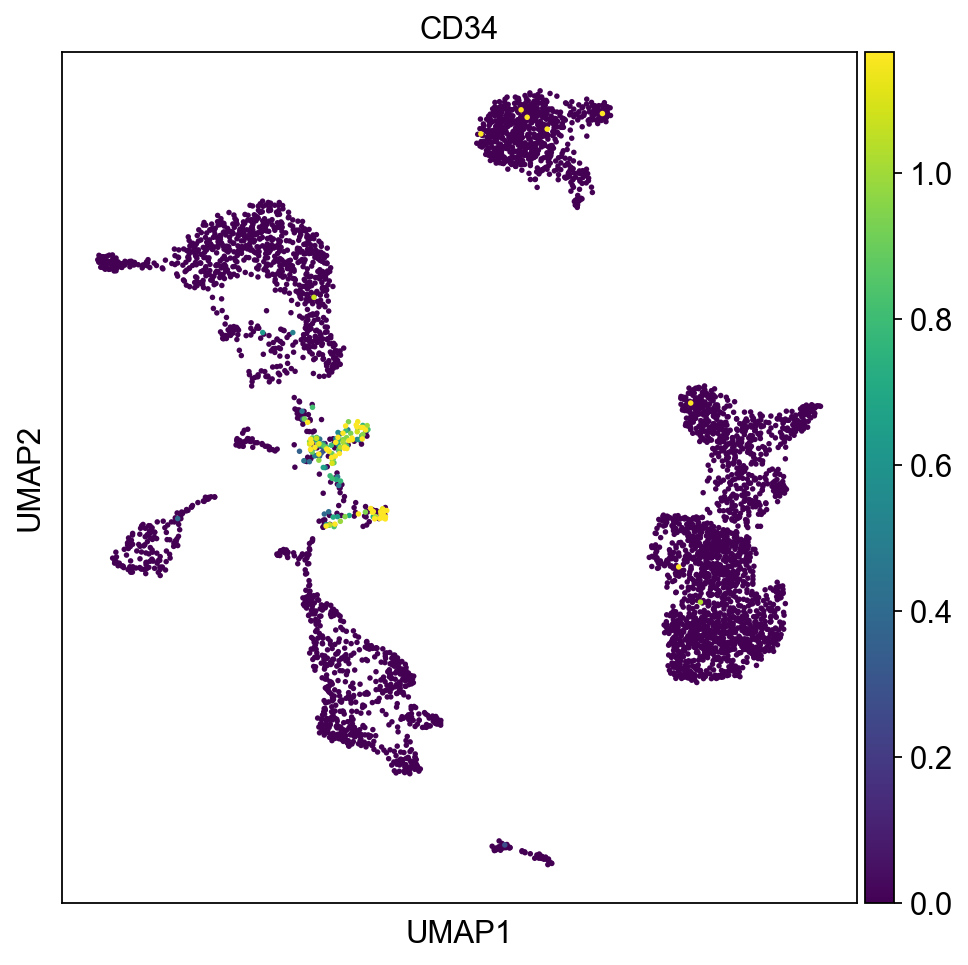

In [114]:
#RNA
print('RNA')
clust3_mels = ['CD34', 'KIT']

sc.pl.umap(eg, color = clust3_mels , vmax="p99", color_map = 'viridis', ncols=2)

#Surface proteins
# KIT=CD117, was not used in the antibody panel

print("Surface protein")

clust3_mels_prot = ['CD34']

sc.pl.umap(eg, color = clust3_mels_prot , vmax="p99", color_map = 'viridis', ncols=2)



## Markers from pseudotime analysis

RNA


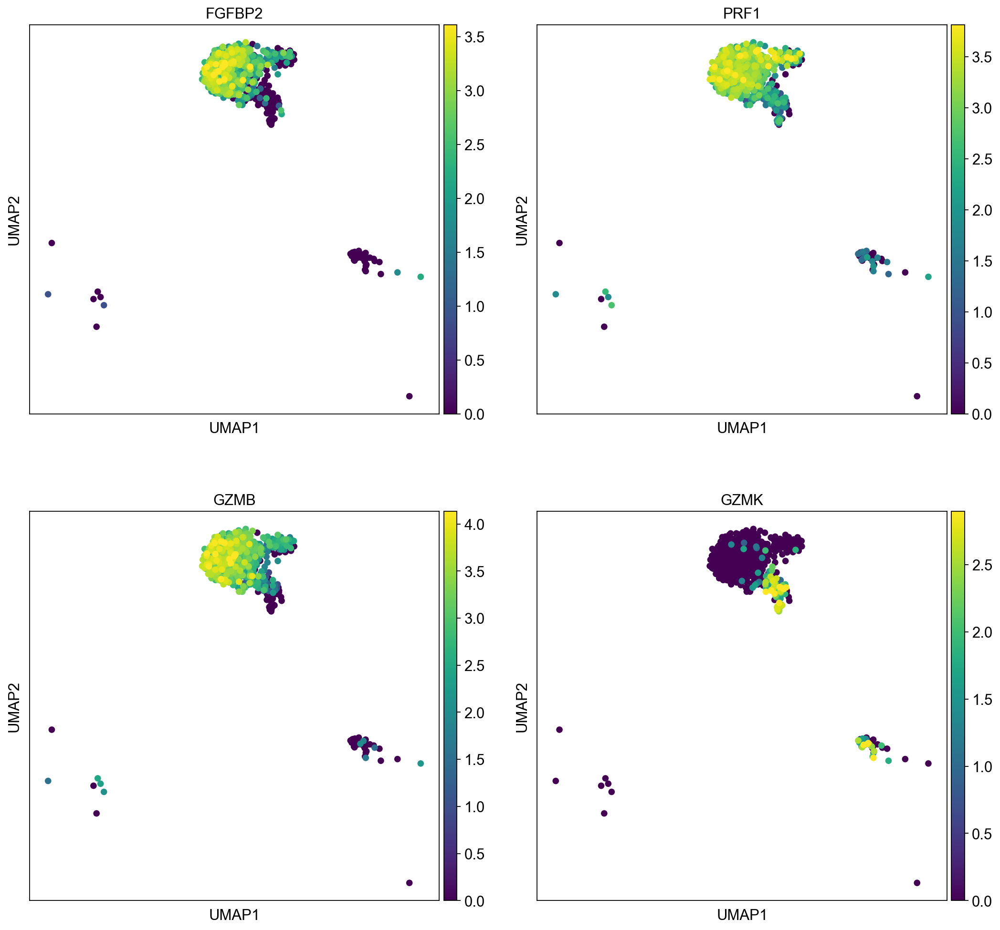

In [115]:
#Markers from pseudotime analysis, granzyme K -> granzyme B (transition from CD56bright to CD56dim)

pseudo_mels = ['FGFBP2', 'PRF1', 'GZMB', 'GZMK']

#RNA

print('RNA')

sc.pl.umap(sample_nk, color = pseudo_mels , vmax="p99", color_map = 'viridis', ncols=2)



RNA


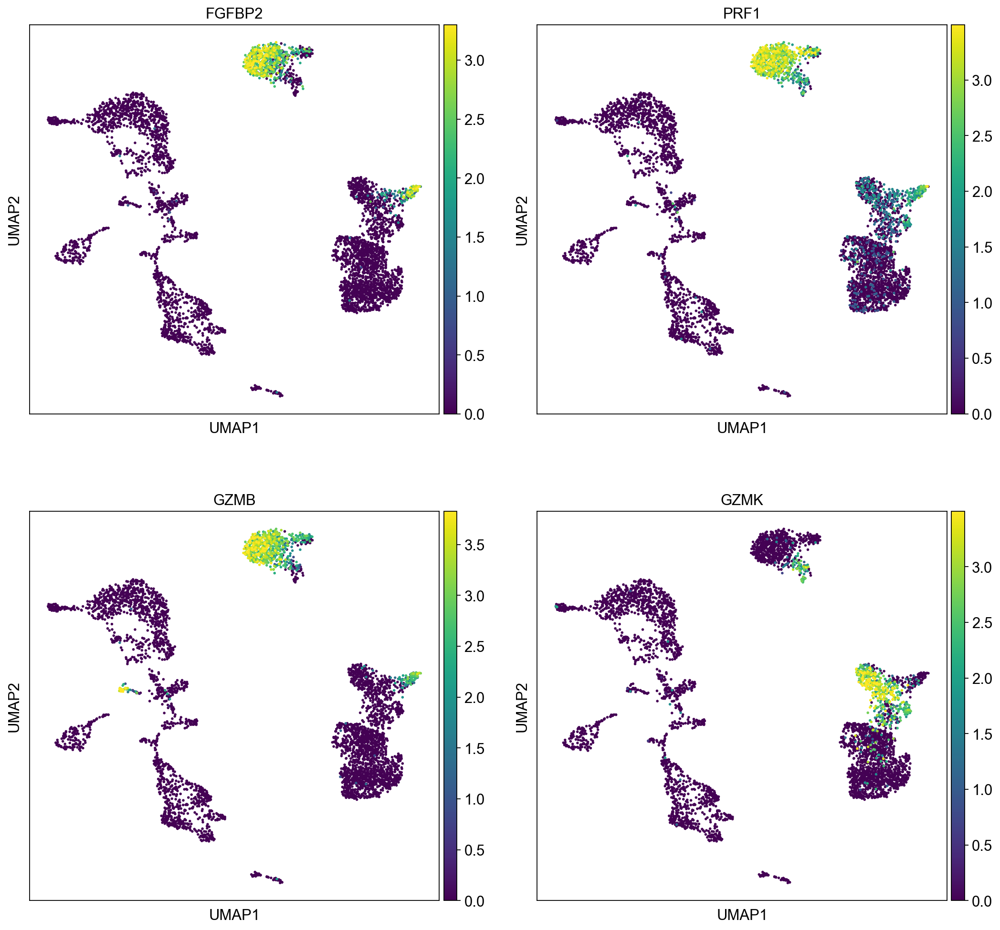

In [116]:
#All cell types

#Markers from pseudotime analysis, granzyme K -> granzyme B (transition from CD56bright to CD56dim)

pseudo_mels = ['FGFBP2', 'PRF1', 'GZMB', 'GZMK']

#RNA

print('RNA')

sc.pl.umap(eg, color = pseudo_mels , vmax="p99", color_map = 'viridis', ncols=2)




- Transition from CD56bright to CD56dim shown when changing from GZMK into GZMB expression? 
- FGFBP2 and PRF1 also more mature NK cell specific